In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Set the style of matplotlib
%matplotlib inline
plt.style.use('fivethirtyeight')

In [2]:
# Load training and testing datasets
train = pd.read_csv('train.csv', index_col='id')
test = pd.read_csv('test.csv', index_col='id')
train

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
id,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,9238,1,1,126.0,1,1,19,...,0,6,7,6,12.428571,0,11.1,0.6,2.02,Graduate
1,1,17,1,9238,1,1,125.0,1,19,19,...,0,6,9,0,0.000000,0,11.1,0.6,2.02,Dropout
2,1,17,2,9254,1,1,137.0,1,3,19,...,0,6,0,0,0.000000,0,16.2,0.3,-0.92,Dropout
3,1,1,3,9500,1,1,131.0,1,19,3,...,0,8,11,7,12.820000,0,11.1,0.6,2.02,Enrolled
4,1,1,2,9500,1,1,132.0,1,19,37,...,0,7,12,6,12.933333,0,7.6,2.6,0.32,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76513,1,17,1,9254,1,1,121.0,1,19,1,...,0,6,8,5,10.600000,0,13.9,-0.3,0.79,Graduate
76514,1,1,6,9254,1,1,125.0,1,1,38,...,0,6,9,6,13.875000,0,9.4,-0.8,-3.12,Graduate
76515,5,17,1,9085,1,1,138.0,1,37,37,...,0,5,8,5,11.400000,1,9.4,-0.8,-3.12,Enrolled


In [3]:
# Check if there are any missing values
train.isna().sum().sort_values(ascending=False)

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder                                0
Age at enrol

In [4]:
# Print the number of rows before dropping
print(f"Original number of rows in the training data: {len(train)}")

# Drop the rows where the 'Target' column has a missing value
train.dropna(subset=['Target'], inplace=True)

# Print the number of rows after dropping
print(f"Number of rows after dropping missing target values: {len(train)}")

# Verify that all missing values have been removed
print("\nMissing values check after cleaning:")
print(train.isna().sum().sort_values(ascending=False))

Original number of rows in the training data: 76518
Number of rows after dropping missing target values: 76518

Missing values check after cleaning:
Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to 

In [5]:
# Check if there are duplicate rows
num_duplicates = train.duplicated().sum()
print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 0


In [6]:
# View the general information of the training dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76518 entries, 0 to 76517
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  76518 non-null  int64  
 1   Application mode                                76518 non-null  int64  
 2   Application order                               76518 non-null  int64  
 3   Course                                          76518 non-null  int64  
 4   Daytime/evening attendance                      76518 non-null  int64  
 5   Previous qualification                          76518 non-null  int64  
 6   Previous qualification (grade)                  76518 non-null  float64
 7   Nacionality                                     76518 non-null  int64  
 8   Mother's qualification                          76518 non-null  int64  
 9   Father's qualification                      

In [7]:
# View the statistical description of training dataset
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Marital status,76518.0,1.111934,0.441669,1.00,1.000000,1.000000,1.000000,6.000
Application mode,76518.0,16.054419,16.682337,1.00,1.000000,17.000000,39.000000,53.000
Application order,76518.0,1.644410,1.229645,0.00,1.000000,1.000000,2.000000,9.000
Course,76518.0,9001.286377,1803.438531,33.00,9119.000000,9254.000000,9670.000000,9991.000
Daytime/evening attendance,76518.0,0.915314,0.278416,0.00,1.000000,1.000000,1.000000,1.000
Previous qualification,76518.0,3.658760,8.623774,1.00,1.000000,1.000000,1.000000,43.000
Previous qualification (grade),76518.0,132.378766,10.995328,95.00,125.000000,133.100000,140.000000,190.000
Nacionality,76518.0,1.226600,3.392183,1.00,1.000000,1.000000,1.000000,109.000
Mother's qualification,76518.0,19.837633,15.399456,1.00,1.000000,19.000000,37.000000,44.000
Father's qualification,76518.0,23.425076,14.921164,1.00,4.000000,19.000000,37.000000,44.000


In [8]:
# Store the names of feature columns
initial_features = list(test.columns)
initial_features

['Marital status',
 'Application mode',
 'Application order',
 'Course',
 'Daytime/evening attendance',
 'Previous qualification',
 'Previous qualification (grade)',
 'Nacionality',
 "Mother's qualification",
 "Father's qualification",
 "Mother's occupation",
 "Father's occupation",
 'Admission grade',
 'Displaced',
 'Educational special needs',
 'Debtor',
 'Tuition fees up to date',
 'Gender',
 'Scholarship holder',
 'Age at enrollment',
 'International',
 'Curricular units 1st sem (credited)',
 'Curricular units 1st sem (enrolled)',
 'Curricular units 1st sem (evaluations)',
 'Curricular units 1st sem (approved)',
 'Curricular units 1st sem (grade)',
 'Curricular units 1st sem (without evaluations)',
 'Curricular units 2nd sem (credited)',
 'Curricular units 2nd sem (enrolled)',
 'Curricular units 2nd sem (evaluations)',
 'Curricular units 2nd sem (approved)',
 'Curricular units 2nd sem (grade)',
 'Curricular units 2nd sem (without evaluations)',
 'Unemployment rate',
 'Inflation rat

2. Exploratory Data Analysis

In [9]:
# Print the number of unique values for each column
for col in train.columns:
    print(f'{col} has {train[col].nunique()} values')

Marital status has 6 values
Application mode has 22 values
Application order has 8 values
Course has 19 values
Daytime/evening attendance has 2 values
Previous qualification has 21 values
Previous qualification (grade) has 110 values
Nacionality has 18 values
Mother's qualification has 35 values
Father's qualification has 39 values
Mother's occupation has 40 values
Father's occupation has 56 values
Admission grade has 668 values
Displaced has 2 values
Educational special needs has 2 values
Debtor has 2 values
Tuition fees up to date has 2 values
Gender has 2 values
Scholarship holder has 2 values
Age at enrollment has 46 values
International has 2 values
Curricular units 1st sem (credited) has 21 values
Curricular units 1st sem (enrolled) has 24 values
Curricular units 1st sem (evaluations) has 36 values
Curricular units 1st sem (approved) has 23 values
Curricular units 1st sem (grade) has 1206 values
Curricular units 1st sem (without evaluations) has 12 values
Curricular units 2nd sem

In [10]:
# Classify columns for better visualization
# Categorical columns: if the number of unique values is 8 or fewer
cat_cols = [col for col in train.columns if train[col].nunique() <= 8]
# Numerical columns: if the number of unique values is 9 or more
num_cols = [col for col in train.columns if train[col].nunique() >= 9]

In [11]:
len(cat_cols)

11

In [12]:
len(num_cols)

26

Outlier Analysis (IQR Method):
                                           Feature  Total_Outliers  \
21                Curricular units 2nd sem (grade)           18482   
15                Curricular units 1st sem (grade)           16059   
18             Curricular units 2nd sem (enrolled)           14416   
19          Curricular units 2nd sem (evaluations)           11254   
13          Curricular units 1st sem (evaluations)           10692   
2                           Previous qualification            9335   
12             Curricular units 1st sem (enrolled)            9135   
10                               Age at enrollment            8935   
1                                           Course            5371   
11             Curricular units 1st sem (credited)            3089   
17             Curricular units 2nd sem (credited)            2709   
9                                  Admission grade            2577   
16  Curricular units 1st sem (without evaluations)         

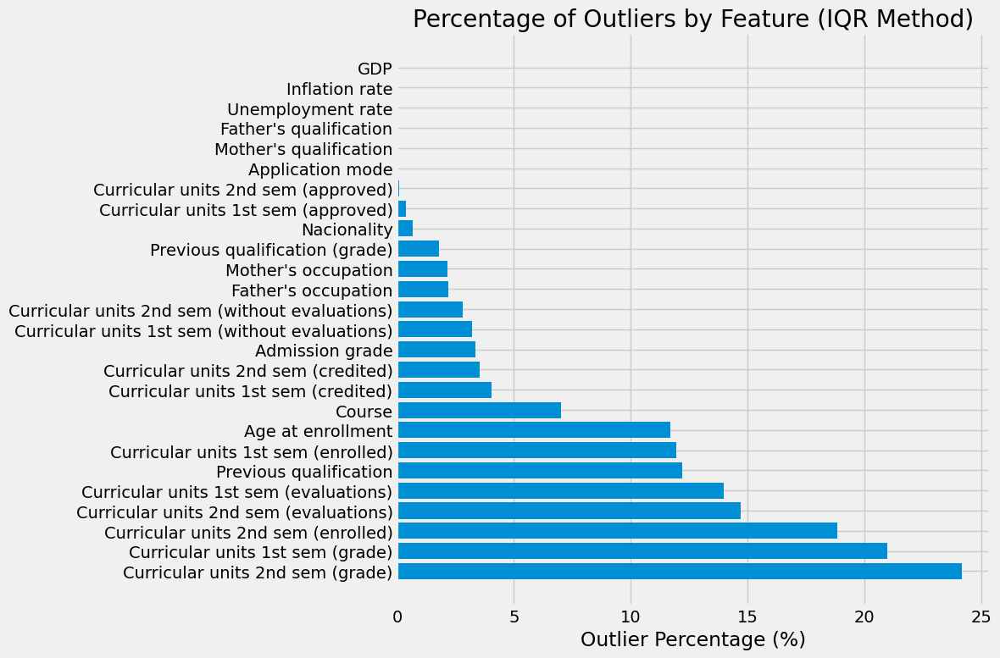

In [13]:
# 13. Outlier Analysis using IQR Method
outlier_summary = []

for col in num_cols:
    Q1 = train[col].quantile(0.25)
    Q3 = train[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = train[(train[col] < lower_bound) | (train[col] > upper_bound)]
    
    outlier_summary.append({
        'Feature': col,
        'Total_Outliers': len(outliers),
        'Outlier_Percentage': (len(outliers) / len(train)) * 100,
        'Lower_Bound': lower_bound,
        'Upper_Bound': upper_bound
    })

outlier_df = pd.DataFrame(outlier_summary).sort_values('Outlier_Percentage', ascending=False)

print("Outlier Analysis (IQR Method):")
print("=" * 50)
print(outlier_df)

# Visualize outlier percentages
plt.figure(figsize=(12, 8))
plt.barh(outlier_df['Feature'], outlier_df['Outlier_Percentage'])
plt.xlabel('Outlier Percentage (%)')
plt.title('Percentage of Outliers by Feature (IQR Method)')
plt.tight_layout()
plt.show()

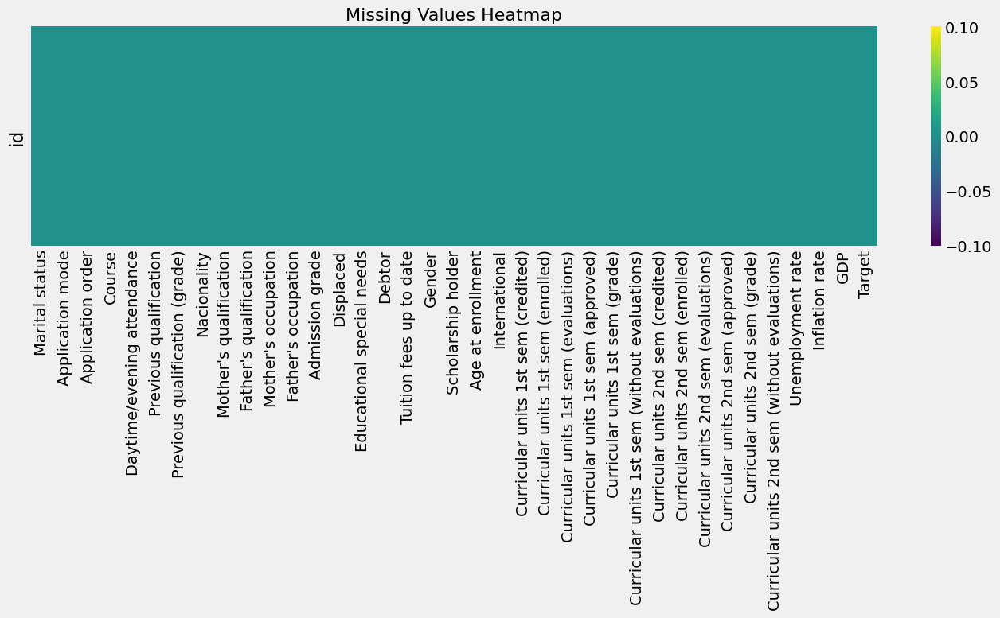


Missing Values Percentage:
Empty DataFrame
Columns: [Column, Missing_Percentage]
Index: []


In [14]:
# 8. Missing Values Heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train.isnull(), yticklabels=False, cbar=True, cmap='viridis')
plt.title('Missing Values Heatmap', fontsize=16)
plt.tight_layout()
plt.show()

# Also show missing values percentage
missing_percent = (train.isnull().sum() / len(train)) * 100
missing_df = pd.DataFrame({
    'Column': missing_percent.index,
    'Missing_Percentage': missing_percent.values
}).sort_values('Missing_Percentage', ascending=False)

print("\nMissing Values Percentage:")
print(missing_df[missing_df['Missing_Percentage'] > 0])

Target Distribution Analysis:
Counts:
Target
Graduate    36282
Dropout     25296
Enrolled    14940
Name: count, dtype: int64

Proportions:
Target
Graduate    0.474163
Dropout     0.330589
Enrolled    0.195248
Name: proportion, dtype: float64


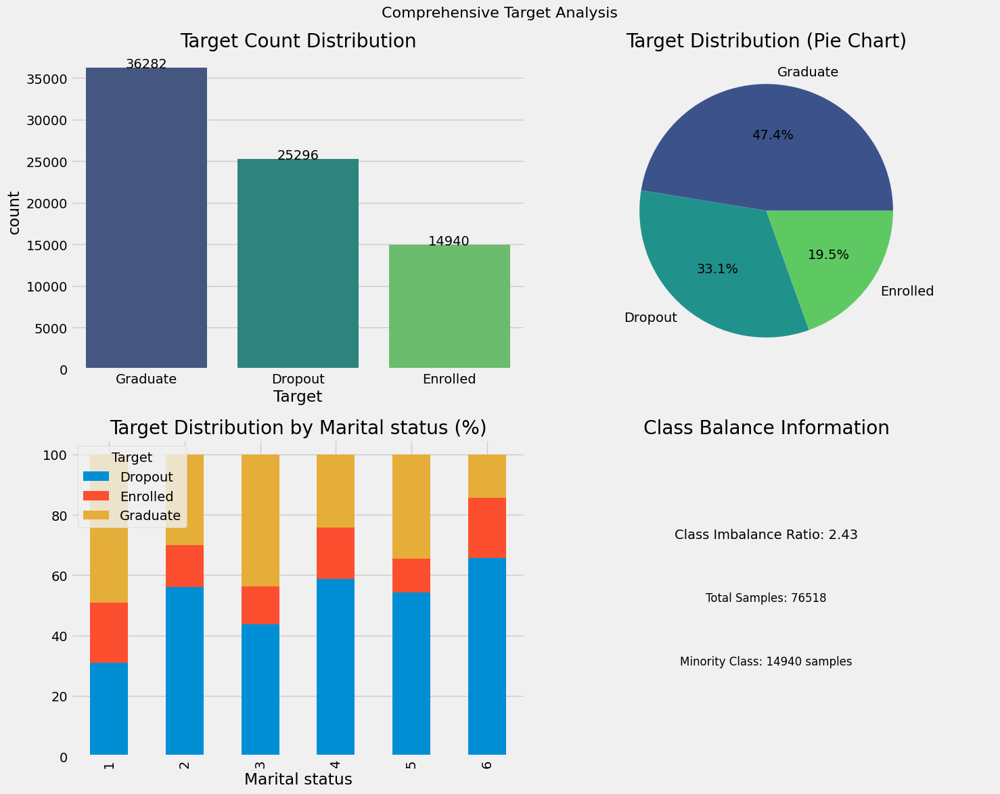

In [15]:
# 15. Detailed Target Distribution Analysis

# Target class proportions
target_counts = train['Target'].value_counts()
target_props = train['Target'].value_counts(normalize=True)

print("Target Distribution Analysis:")
print("=" * 40)
print("Counts:")
print(target_counts)
print("\nProportions:")
print(target_props)

# Create subplots for comprehensive target analysis
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Count plot
sns.countplot(data=train, x='Target', ax=axes[0,0], palette='viridis')
axes[0,0].set_title('Target Count Distribution')
for p in axes[0,0].patches:
    axes[0,0].text(p.get_x() + p.get_width()/2, p.get_height() + 5, 
                   f'{int(p.get_height())}', ha="center")

# Pie chart
axes[0,1].pie(target_counts.values, labels=target_counts.index, autopct='%1.1f%%',
              colors=sns.color_palette('viridis', len(target_counts)))
axes[0,1].set_title('Target Distribution (Pie Chart)')

# Target distribution by a categorical variable (if available)
if len(cat_cols) > 1:  # More than just Target
    first_cat = [col for col in cat_cols if col != 'Target'][0]
    ct = pd.crosstab(train[first_cat], train['Target'], normalize='index') * 100
    ct.plot(kind='bar', ax=axes[1,0], stacked=True)
    axes[1,0].set_title(f'Target Distribution by {first_cat} (%)')
    axes[1,0].legend(title='Target')

# Class imbalance ratio
imbalance_ratio = target_counts.max() / target_counts.min()
axes[1,1].text(0.5, 0.7, f'Class Imbalance Ratio: {imbalance_ratio:.2f}', 
               ha='center', va='center', transform=axes[1,1].transAxes, fontsize=14)
axes[1,1].text(0.5, 0.5, f'Total Samples: {len(train)}', 
               ha='center', va='center', transform=axes[1,1].transAxes, fontsize=12)
axes[1,1].text(0.5, 0.3, f'Minority Class: {target_counts.min()} samples', 
               ha='center', va='center', transform=axes[1,1].transAxes, fontsize=12)
axes[1,1].set_title('Class Balance Information')
axes[1,1].axis('off')

plt.suptitle('Comprehensive Target Analysis', fontsize=16)
plt.tight_layout()
plt.show()

In [16]:
# 14. Interactive Plotly Visualizations

# Interactive scatter plot matrix
if len(num_cols) >= 3:
    # Select top 4 numerical columns for scatter matrix
    top_4_cols = num_cols[:4]
    
    fig = px.scatter_matrix(train, dimensions=top_4_cols, color='Target',
                           title="Interactive Scatter Matrix of Top Numerical Features")
    fig.show()

# Interactive correlation heatmap
fig = px.imshow(train[num_cols].corr(), 
                text_auto=True, 
                aspect="auto",
                title="Interactive Correlation Heatmap",
                color_continuous_scale='RdYlBu_r')
fig.show()

# Interactive box plots
for col in num_cols[:3]:  # Show first 3 numerical columns
    fig = px.box(train, x='Target', y=col, 
                 title=f'Interactive Box Plot: {col} vs Target')
    fig.show()

2.1 Target Distribution

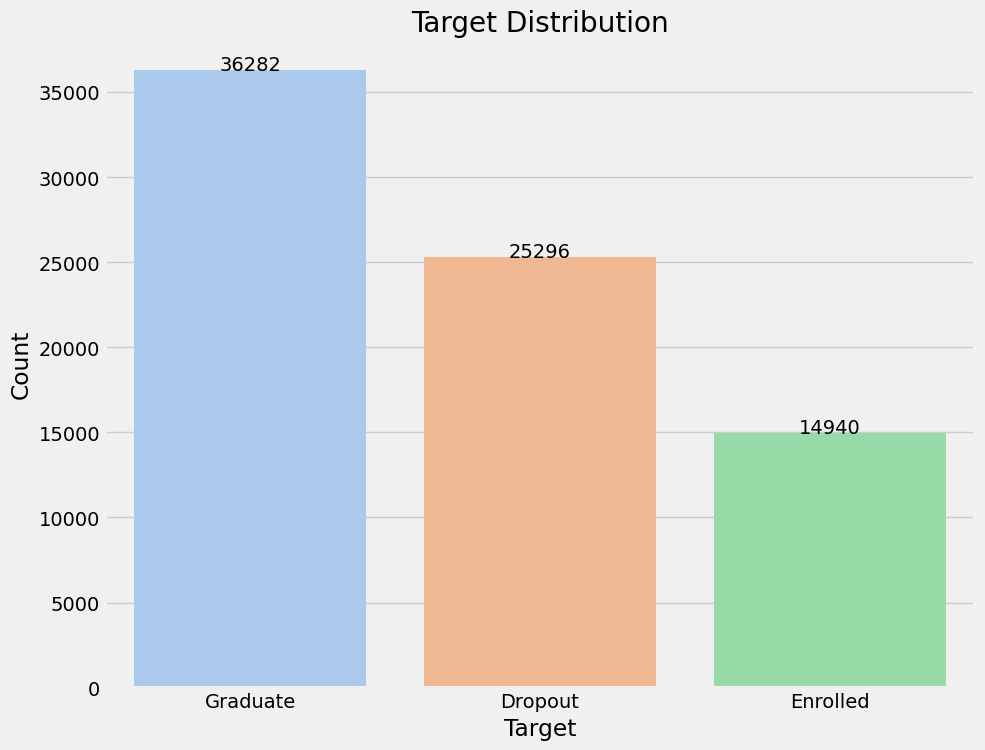

In [17]:
# Target distribution
# Set the figure size and create a count plot
plt.figure(figsize=(10, 8))
ax = sns.countplot(x='Target', data=train, palette='pastel')

# Add labels to each bar in the plot
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 3, f'{int(p.get_height())}', ha="center")

plt.xlabel('Target')
plt.ylabel('Count')
plt.title('Target Distribution')
plt.show()

2.2 Distribution of Categorical Variables

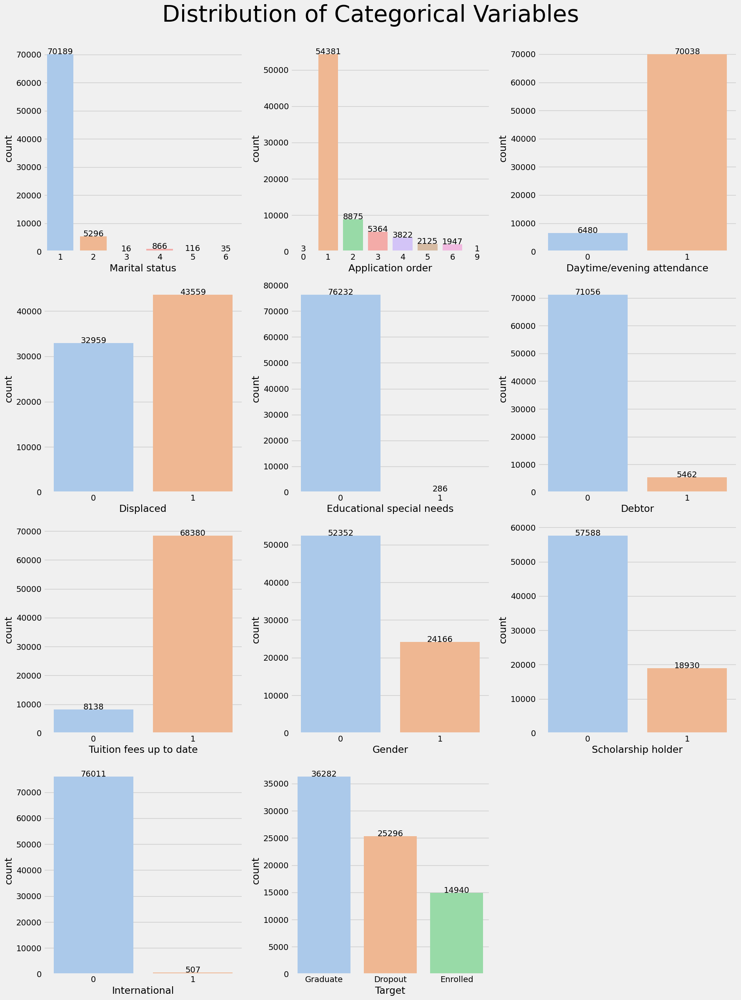

In [18]:
# Distribution of categorical variables
plt.figure(figsize=(18, 24))
plotnumber = 1

for col in cat_cols:
    if plotnumber <= len(cat_cols):
        ax = plt.subplot(4, 3, plotnumber)
        sns.countplot(x=train[col], data=train, palette='pastel')

        # Add labels to each bar in the plot
        for p in ax.patches:
            ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 3, f'{int(p.get_height())}', ha="center")

        plt.xlabel(col)
        # plt.xticks(rotation=45)
        plt.xlabel(col)

    plotnumber += 1

plt.suptitle('Distribution of Categorical Variables', fontsize=40, y=1)
plt.tight_layout()
plt.show()

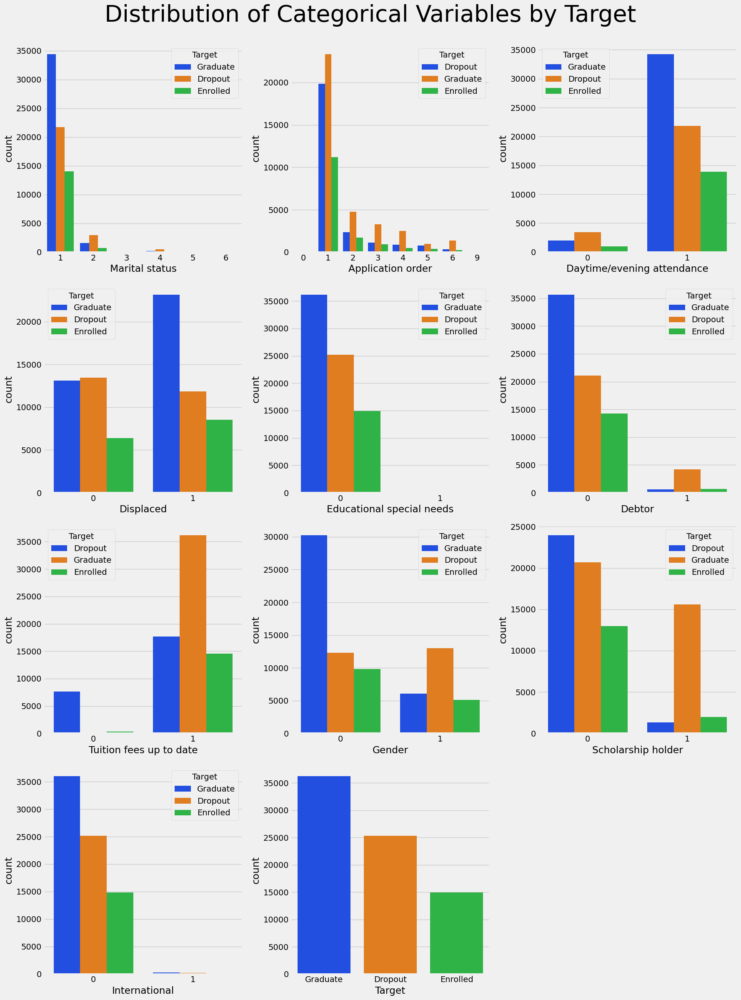

In [19]:
plt.figure(figsize=(18, 24))
plotnumber = 1

# Loop through each column
for col in cat_cols:
    if plotnumber <= len(cat_cols):
        plt.subplot(4, 3, plotnumber)
        ax = sns.countplot(x=train[col], hue=train['Target'], palette='bright')

    plotnumber += 1

plt.suptitle('Distribution of Categorical Variables by Target', fontsize=40, y=1)
plt.tight_layout()
plt.show()

2.3 Distribution of Numerical Variables

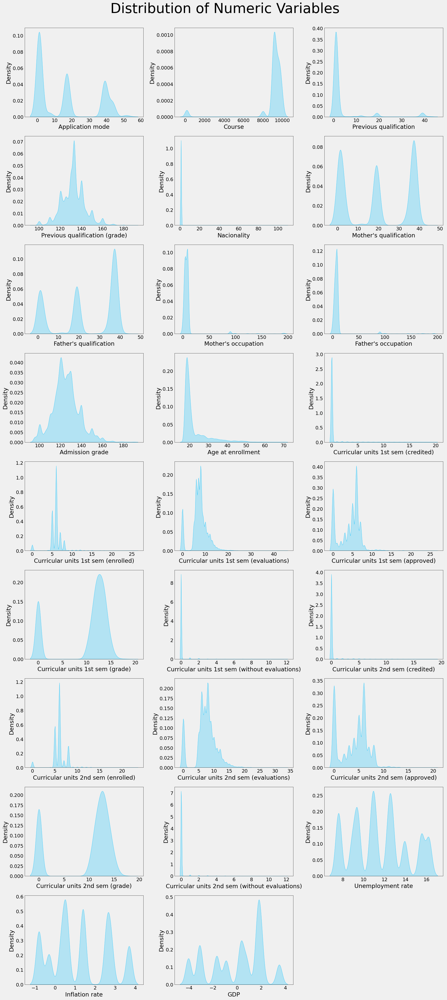

In [20]:
# Distribution of numeric variables
plt.figure(figsize=(18, 40))
plotnumber = 1

for column in num_cols:
    if plotnumber <= len(num_cols):
        ax = plt.subplot(9, 3, plotnumber)
        sns.kdeplot(train[column], color='deepskyblue', fill=True)
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(0.5)
        plt.xlabel(column)
        ax.grid(False)

    plotnumber += 1

plt.suptitle('Distribution of Numeric Variables', fontsize=40, y=1)
plt.tight_layout()
plt.show()

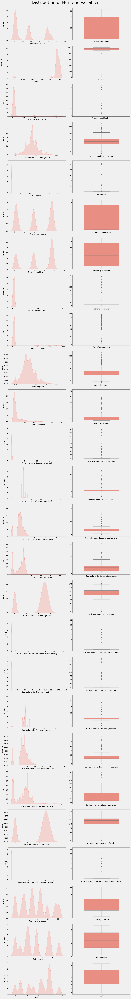

In [21]:
plt.figure(figsize=(18, 135))
plotnumber = 1

for col in num_cols:
    if plotnumber <= len(num_cols):

        ax1 = plt.subplot(len(num_cols), 2, 2 * plotnumber - 1)
        sns.kdeplot(train[col], color='salmon', fill=True)
        for spine in ax1.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(0.5)
        ax1.set_xlabel(col)
        ax1.grid(False)

        ax2 = plt.subplot(len(num_cols), 2, 2 * plotnumber)
        sns.boxplot(y=train[col], color='salmon', width=0.6, linewidth=1)
        for spine in ax2.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(0.5)
        ax2.set_xlabel(col)
        ax2.set_ylabel('')
        ax2.grid(False)

    plotnumber += 1

plt.suptitle('Distribution of Numeric Variables', fontsize=40, y=1)
plt.tight_layout()
plt.show()

Missing Values Analysis:
Great! No missing values found in the dataset.
Dataset shape: (76518, 37)
Total cells checked: 2831166


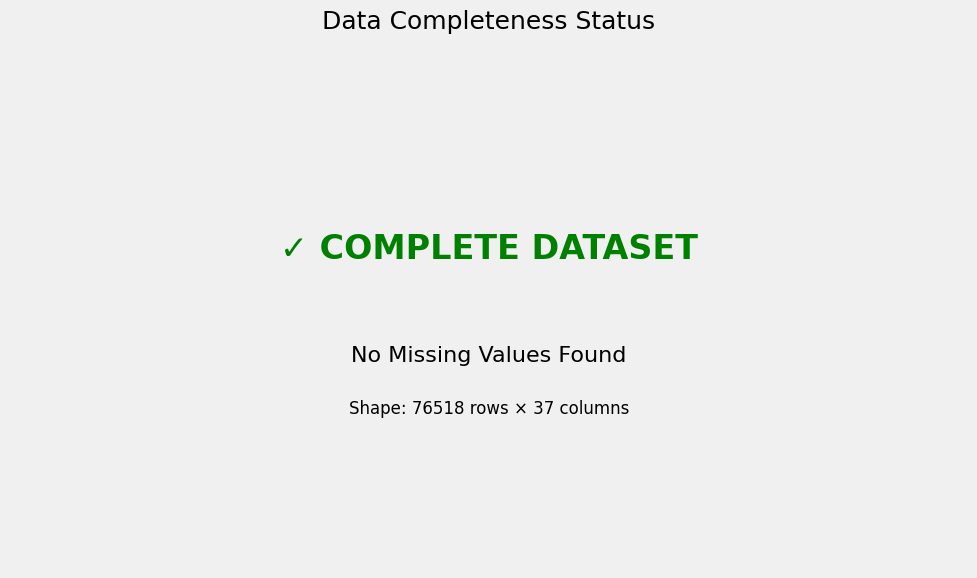

In [22]:
# 8. Missing Values Analysis and Heatmap
print("Missing Values Analysis:")
print("=" * 40)

# Check if there are any missing values
missing_counts = train.isnull().sum()
total_missing = missing_counts.sum()

if total_missing > 0:
    # Create missing values heatmap
    plt.figure(figsize=(14, 8))
    
    # Only create heatmap if there are missing values
    missing_data = train.isnull()
    
    # If dataset is too large, sample for visualization
    if len(train) > 1000:
        sample_size = min(1000, len(train))
        missing_sample = missing_data.sample(n=sample_size, random_state=42)
        sns.heatmap(missing_sample.T, cbar=True, cmap='viridis', 
                   yticklabels=True, xticklabels=False)
        plt.title(f'Missing Values Heatmap (Sample of {sample_size} rows)', fontsize=16)
    else:
        sns.heatmap(missing_data.T, cbar=True, cmap='viridis', 
                   yticklabels=True, xticklabels=False)
        plt.title('Missing Values Heatmap', fontsize=16)
    
    plt.ylabel('Features')
    plt.xlabel('Samples')
    plt.tight_layout()
    plt.show()
    
    # Show missing values percentage
    missing_percent = (missing_counts / len(train)) * 100
    missing_df = pd.DataFrame({
        'Column': missing_percent.index,
        'Missing_Count': missing_counts.values,
        'Missing_Percentage': missing_percent.values
    }).sort_values('Missing_Percentage', ascending=False)
    
    # Only show columns with missing values
    missing_df_filtered = missing_df[missing_df['Missing_Percentage'] > 0]
    
    if len(missing_df_filtered) > 0:
        print("\nMissing Values by Column:")
        print(missing_df_filtered.to_string(index=False))
        
        # Visualize missing percentages
        if len(missing_df_filtered) > 0:
            plt.figure(figsize=(10, 6))
            plt.barh(missing_df_filtered['Column'], missing_df_filtered['Missing_Percentage'])
            plt.xlabel('Missing Percentage (%)')
            plt.title('Missing Values Percentage by Feature')
            plt.tight_layout()
            plt.show()
    else:
        print("No missing values found in any column!")
        
else:
    print("Great! No missing values found in the dataset.")
    print(f"Dataset shape: {train.shape}")
    print(f"Total cells checked: {train.shape[0] * train.shape[1]}")
    
    # Create a simple visualization showing data completeness
    plt.figure(figsize=(10, 6))
    plt.text(0.5, 0.6, '✓ COMPLETE DATASET', fontsize=24, ha='center', va='center', 
             color='green', weight='bold', transform=plt.gca().transAxes)
    plt.text(0.5, 0.4, f'No Missing Values Found', fontsize=16, ha='center', va='center',
             transform=plt.gca().transAxes)
    plt.text(0.5, 0.3, f'Shape: {train.shape[0]} rows × {train.shape[1]} columns', 
             fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
    plt.axis('off')
    plt.title('Data Completeness Status', fontsize=18)
    plt.tight_layout()
    plt.show()

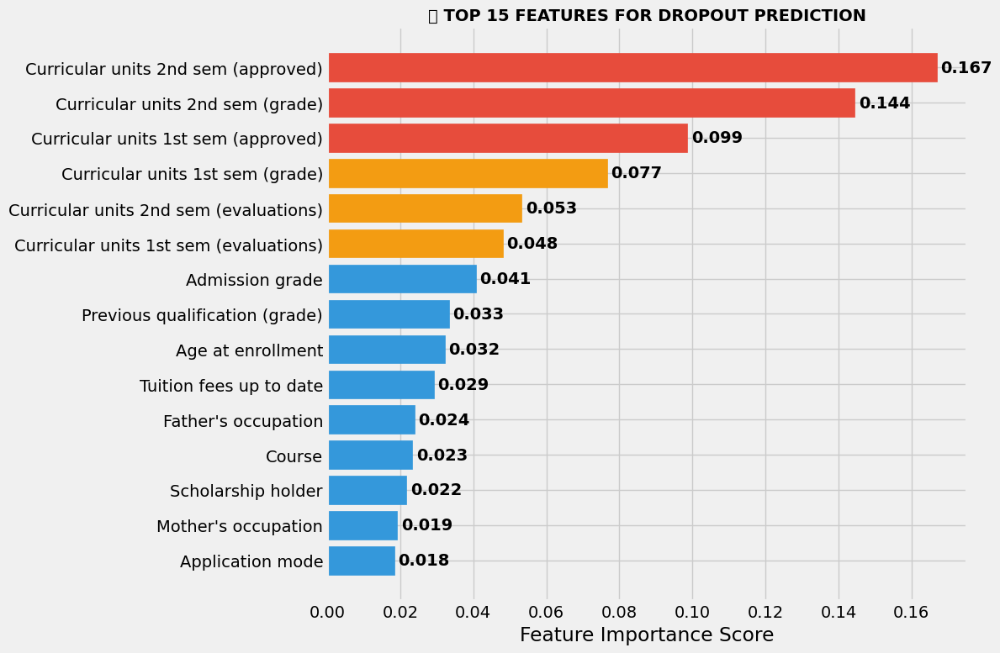


🎯 FEATURE IMPORTANCE ANALYSIS
TOP 10 MOST PREDICTIVE FEATURES:
 1. Curricular units 2nd sem (approved) 0.1670
 2. Curricular units 2nd sem (grade)    0.1445
 3. Curricular units 1st sem (approved) 0.0987
 4. Curricular units 1st sem (grade)    0.0767
 5. Curricular units 2nd sem (evaluations) 0.0533
 6. Curricular units 1st sem (evaluations) 0.0482
 7. Admission grade                     0.0407
 8. Previous qualification (grade)      0.0334
 9. Age at enrollment                   0.0322
10. Tuition fees up to date             0.0292

📚 Academic Features in Top 10: 8
👥 Demographic Features in Top 10: 1
💰 Economic Features in Top 10: 0

✅ Features needed for 80% predictive power: 14
✅ Top feature accounts for 16.7% of predictive power


In [23]:
# 5. Feature Importance Analysis - PREDICTIVE POWER
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

# Prepare data for feature importance
X = train.drop('Target', axis=1).copy()
y = train['Target'].copy()

# Handle categorical variables
categorical_columns = X.select_dtypes(include=['object']).columns
le_dict = {}

for col in categorical_columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))
    le_dict[col] = le

# Handle missing values
for col in X.columns:
    if X[col].isnull().any():
        if X[col].dtype in ['int64', 'float64']:
            X[col].fillna(X[col].median(), inplace=True)
        else:
            X[col].fillna(X[col].mode()[0], inplace=True)

# Train Random Forest for feature importance
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X, y)

# Get feature importance
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

# Plot top 15 most important features
plt.figure(figsize=(12, 8))
top_features = feature_importance.head(15)

bars = plt.barh(range(len(top_features)), top_features['Importance'])

# Color bars by importance level
colors = ['#e74c3c' if x > top_features['Importance'].quantile(0.8) else 
          '#f39c12' if x > top_features['Importance'].quantile(0.6) else 
          '#3498db' for x in top_features['Importance']]

for bar, color in zip(bars, colors):
    bar.set_color(color)

plt.yticks(range(len(top_features)), top_features['Feature'])
plt.xlabel('Feature Importance Score')
plt.title('🎯 TOP 15 FEATURES FOR DROPOUT PREDICTION', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()

# Add importance values on bars
for i, v in enumerate(top_features['Importance']):
    plt.text(v + 0.001, i, f'{v:.3f}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

# Feature categories analysis
print("\n🎯 FEATURE IMPORTANCE ANALYSIS")
print("=" * 50)
print("TOP 10 MOST PREDICTIVE FEATURES:")
for i, (_, row) in enumerate(top_features.head(10).iterrows(), 1):
    print(f"{i:2d}. {row['Feature']:<35} {row['Importance']:.4f}")

# Categorize features
academic_features = [f for f in top_features['Feature'][:10] 
                    if any(keyword in f.lower() for keyword in 
                          ['grade', 'units', 'evaluation', 'curricular'])]

demographic_features = [f for f in top_features['Feature'][:10] 
                       if any(keyword in f.lower() for keyword in 
                             ['age', 'gender', 'nationality', 'mother', 'father'])]

economic_features = [f for f in top_features['Feature'][:10] 
                    if any(keyword in f.lower() for keyword in 
                          ['gdp', 'inflation', 'unemployment'])]

print(f"\n📚 Academic Features in Top 10: {len(academic_features)}")
print(f"👥 Demographic Features in Top 10: {len(demographic_features)}")
print(f"💰 Economic Features in Top 10: {len(economic_features)}")

# Cumulative importance
cumulative_importance = feature_importance['Importance'].cumsum()
features_for_80_percent = (cumulative_importance <= 0.8).sum() + 1

print(f"\n✅ Features needed for 80% predictive power: {features_for_80_percent}")
print(f"✅ Top feature accounts for {top_features.iloc[0]['Importance']:.1%} of predictive power")

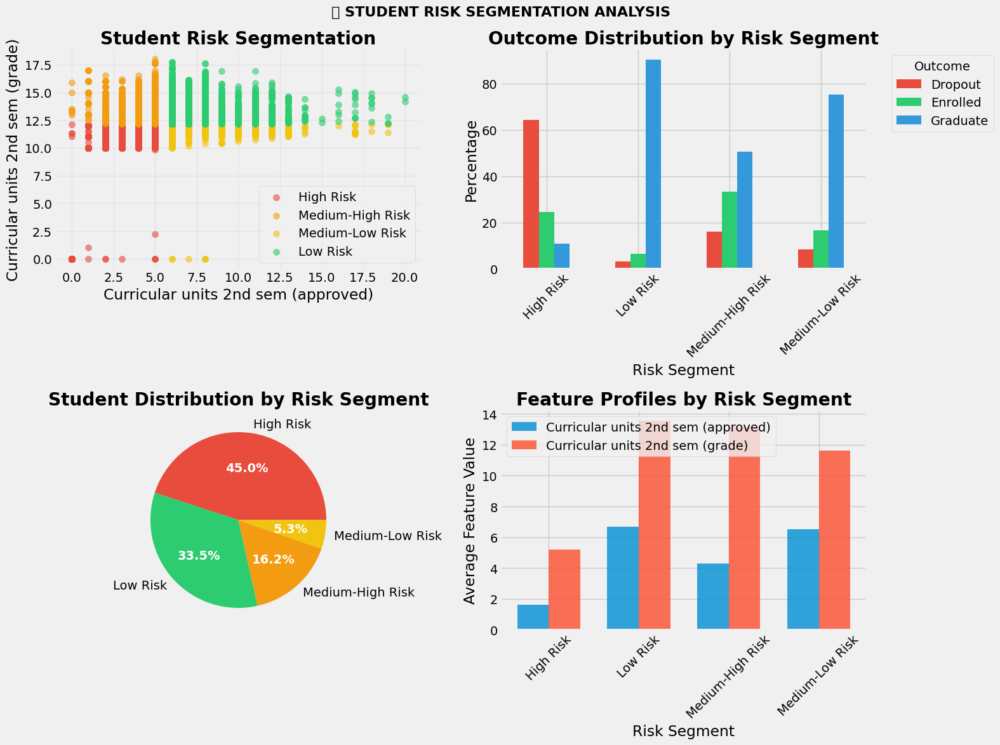


🎯 RISK SEGMENTATION INSIGHTS
Segmentation based on: Curricular units 2nd sem (approved) & Curricular units 2nd sem (grade)

Segment Sizes:
  High Risk: 34,419 students (45.0%)
  Low Risk: 25,661 students (33.5%)
  Medium-High Risk: 12,385 students (16.2%)
  Medium-Low Risk: 4,053 students (5.3%)

Dropout Rates by Segment:
  High Risk: 0.0%
  Low Risk: 0.0%
  Medium-High Risk: 0.0%
  Medium-Low Risk: 0.0%


In [24]:
# 6. Student Risk Segmentation - ACTIONABLE INSIGHTS
plt.figure(figsize=(16, 12))

# Get most important features for segmentation
top_2_features = feature_importance.head(2)['Feature'].tolist()

if len(top_2_features) >= 2:
    feat1, feat2 = top_2_features[0], top_2_features[1]
    
    # Create risk segments based on top 2 features
    feat1_median = train[feat1].median()
    feat2_median = train[feat2].median()
    
    # Define risk segments
    conditions = [
        (train[feat1] <= feat1_median) & (train[feat2] <= feat2_median),
        (train[feat1] <= feat1_median) & (train[feat2] > feat2_median),
        (train[feat1] > feat1_median) & (train[feat2] <= feat2_median),
        (train[feat1] > feat1_median) & (train[feat2] > feat2_median)
    ]
    
    choices = ['High Risk', 'Medium-High Risk', 'Medium-Low Risk', 'Low Risk']
    train['Risk_Segment'] = np.select(conditions, choices, default='Unknown')
    
    # Subplot 1: Scatter plot with risk segments
    plt.subplot(2, 2, 1)
    colors = {'High Risk': '#e74c3c', 'Medium-High Risk': '#f39c12', 
              'Medium-Low Risk': '#f1c40f', 'Low Risk': '#2ecc71'}
    
    for segment in choices:
        segment_data = train[train['Risk_Segment'] == segment]
        plt.scatter(segment_data[feat1], segment_data[feat2], 
                   c=colors[segment], label=segment, alpha=0.6, s=50)
    
    plt.xlabel(feat1)
    plt.ylabel(feat2)
    plt.title('Student Risk Segmentation', fontweight='bold')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Subplot 2: Risk segment outcomes
    plt.subplot(2, 2, 2)
    risk_outcomes = pd.crosstab(train['Risk_Segment'], train['Target'], normalize='index') * 100
    
    risk_outcomes.plot(kind='bar', ax=plt.gca(), 
                      color=['#e74c3c', '#2ecc71', '#3498db'])
    plt.title('Outcome Distribution by Risk Segment', fontweight='bold')
    plt.ylabel('Percentage')
    plt.xlabel('Risk Segment')
    plt.legend(title='Outcome', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    
    # Subplot 3: Risk segment sizes
    plt.subplot(2, 2, 3)
    segment_sizes = train['Risk_Segment'].value_counts()
    
    wedges, texts, autotexts = plt.pie(segment_sizes.values, labels=segment_sizes.index,
                                      autopct='%1.1f%%', 
                                      colors=[colors[seg] for seg in segment_sizes.index])
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    plt.title('Student Distribution by Risk Segment', fontweight='bold')
    
    # Subplot 4: Average feature values by segment
    plt.subplot(2, 2, 4)
    segment_means = train.groupby('Risk_Segment')[top_2_features].mean()
    
    x = np.arange(len(segment_means.index))
    width = 0.35
    
    bars1 = plt.bar(x - width/2, segment_means[feat1], width, 
                   label=feat1, alpha=0.8)
    bars2 = plt.bar(x + width/2, segment_means[feat2], width, 
                   label=feat2, alpha=0.8)
    
    plt.xlabel('Risk Segment')
    plt.ylabel('Average Feature Value')
    plt.title('Feature Profiles by Risk Segment', fontweight='bold')
    plt.xticks(x, segment_means.index, rotation=45)
    plt.legend()
    
    plt.suptitle('🎯 STUDENT RISK SEGMENTATION ANALYSIS', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Risk analysis summary
    print("\n🎯 RISK SEGMENTATION INSIGHTS")
    print("=" * 50)
    print(f"Segmentation based on: {feat1} & {feat2}")
    print("\nSegment Sizes:")
    for segment, count in segment_sizes.items():
        pct = (count/len(train))*100
        print(f"  {segment}: {count:,} students ({pct:.1f}%)")
    
    print("\nDropout Rates by Segment:")
    dropout_rates = train.groupby('Risk_Segment')['Target'].apply(
        lambda x: (x == 0).mean() * 100 if 0 in train['Target'].values else 0
    ).round(1)
    
    for segment, rate in dropout_rates.items():
        print(f"  {segment}: {rate:.1f}%")
    
else:
    print("Insufficient features for risk segmentation analysis")

2.4 Correlation Matrix

In [25]:
from sklearn.preprocessing import LabelEncoder

categories = ['dropout', 'enrolled', 'graduate']
label_encoder = LabelEncoder()

# Convert categorical 'Target' labels to numeric values using LabelEncoder
train['Target'] = label_encoder.fit_transform(train['Target'])

🔍 Analyzing dataset for correlation matrix...
Total columns in dataset: 38
Numeric columns found: 37
Non-numeric columns excluded: 1
Excluded columns: ['Risk_Segment']

Dataset shape for correlation: (76518, 37)
Any missing values: 0


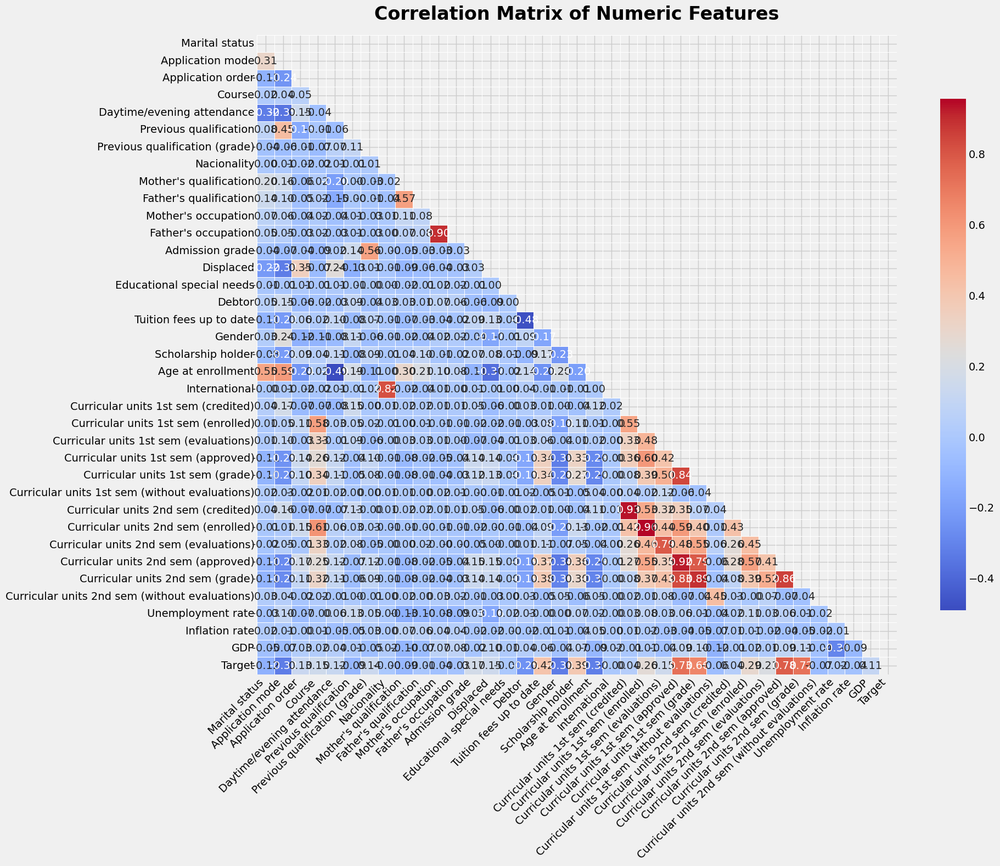


ALTERNATIVE: Including Categorical Variables
Encoded Risk_Segment: 4 unique values


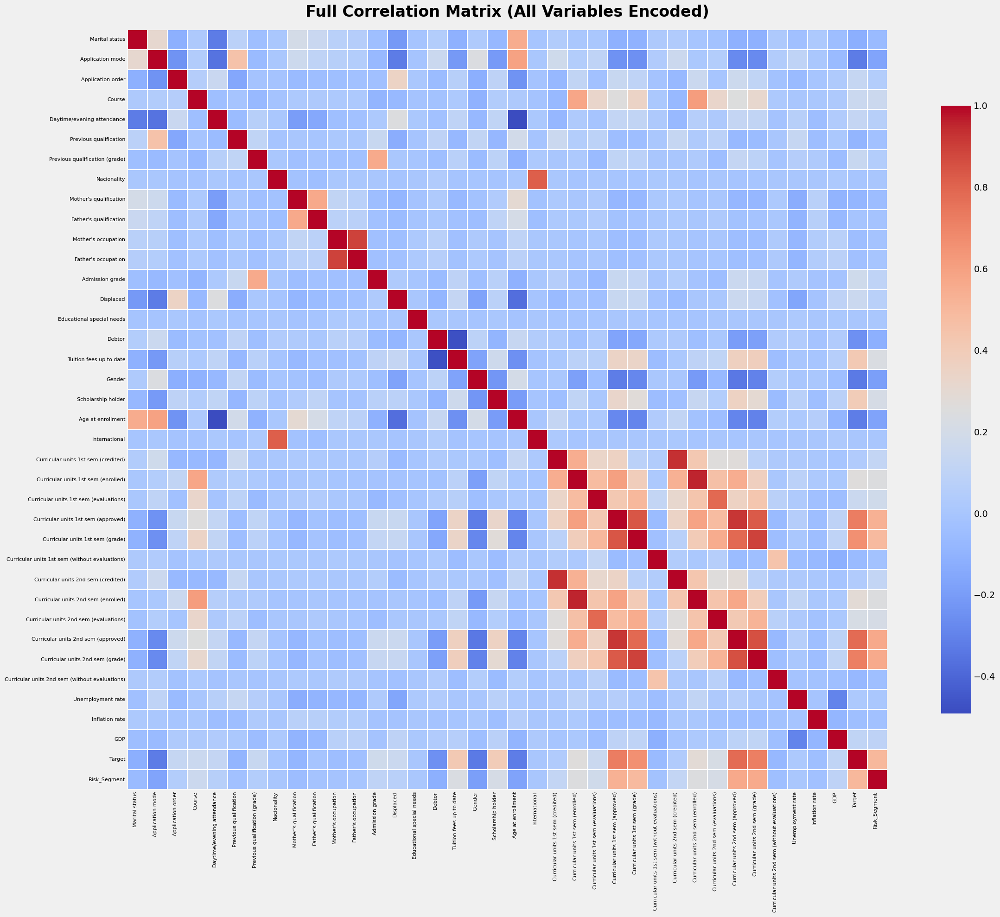


HIGH CORRELATION PAIRS (|correlation| > 0.7)
                             Feature_1                              Feature_2  Correlation
   Curricular units 1st sem (enrolled)    Curricular units 2nd sem (enrolled)        0.956
   Curricular units 1st sem (credited)    Curricular units 2nd sem (credited)        0.934
   Curricular units 1st sem (approved)    Curricular units 2nd sem (approved)        0.923
                   Mother's occupation                    Father's occupation        0.895
      Curricular units 1st sem (grade)       Curricular units 2nd sem (grade)        0.889
   Curricular units 2nd sem (approved)       Curricular units 2nd sem (grade)        0.859
   Curricular units 1st sem (approved)       Curricular units 1st sem (grade)        0.840
   Curricular units 1st sem (approved)       Curricular units 2nd sem (grade)        0.830
                           Nacionality                          International        0.817
      Curricular units 1st sem (grade)    Cu

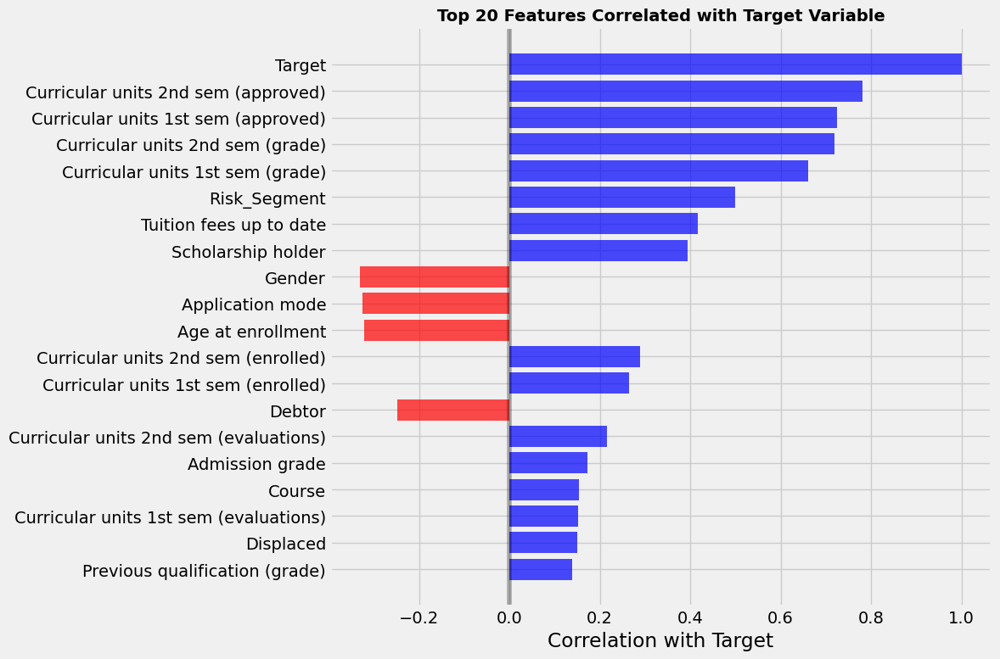


✅ Correlation analysis complete!
💡 Tip: Use the numeric-only version for cleaner visualization
🔍 Check high correlation pairs for potential multicollinearity issues


In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- FIX 1: Select only numeric columns ---
print("🔍 Analyzing dataset for correlation matrix...")
print(f"Total columns in dataset: {len(train.columns)}")

# Get only numeric columns
numeric_columns = train.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numeric columns found: {len(numeric_columns)}")

# Show non-numeric columns that will be excluded
non_numeric_columns = train.select_dtypes(exclude=[np.number]).columns.tolist()
print(f"Non-numeric columns excluded: {len(non_numeric_columns)}")
if non_numeric_columns:
    print("Excluded columns:", non_numeric_columns[:10])  # Show first 10

# --- FIX 2: Create correlation matrix with numeric data only ---
train_numeric = train[numeric_columns]

# Check for any remaining issues
print(f"\nDataset shape for correlation: {train_numeric.shape}")
print(f"Any missing values: {train_numeric.isnull().sum().sum()}")

# --- FIX 3: Enhanced correlation matrix visualization ---
plt.figure(figsize=(20, 16))

# Calculate correlation matrix
correlation_matrix = train_numeric.corr()

# Create mask for better visualization (optional - hides upper triangle)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Create heatmap
sns.heatmap(correlation_matrix, 
            annot=True,           # Show correlation values
            cmap='coolwarm',      # Color scheme
            fmt='.2f',            # Format to 2 decimal places
            linewidths=0.5,       # Line width between cells
            linecolor='white',    # Line color
            square=True,          # Square cells
            cbar_kws={'shrink': 0.8},  # Colorbar size
            mask=mask)            # Optional: mask upper triangle

plt.title('Correlation Matrix of Numeric Features', fontsize=24, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- ALTERNATIVE FIX 4: If you want to include categorical variables ---
print("\n" + "="*60)
print("ALTERNATIVE: Including Categorical Variables")
print("="*60)

# Encode categorical variables for correlation analysis
train_encoded = train.copy()

# Identify categorical columns
categorical_columns = train.select_dtypes(include=['object']).columns.tolist()

# Simple label encoding for categorical variables
from sklearn.preprocessing import LabelEncoder

for col in categorical_columns:
    if col != 'Target':  # Don't encode target if it's categorical
        le = LabelEncoder()
        train_encoded[col] = le.fit_transform(train[col].astype(str))
        print(f"Encoded {col}: {len(le.classes_)} unique values")

# Now create correlation matrix with all variables
plt.figure(figsize=(25, 20))

correlation_matrix_full = train_encoded.corr()

# Create heatmap with all variables
sns.heatmap(correlation_matrix_full, 
            annot=False,          # Don't show values (too many)
            cmap='coolwarm',
            linewidths=0.1,
            square=True,
            cbar_kws={'shrink': 0.8})

plt.title('Full Correlation Matrix (All Variables Encoded)', fontsize=24, fontweight='bold', pad=20)
plt.xticks(rotation=90, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()

# --- FIX 5: Focus on high correlations ---
print("\n" + "="*60)
print("HIGH CORRELATION PAIRS (|correlation| > 0.7)")
print("="*60)

# Find high correlation pairs
high_corr_pairs = []
for i in range(len(correlation_matrix_full.columns)):
    for j in range(i+1, len(correlation_matrix_full.columns)):
        corr_value = correlation_matrix_full.iloc[i, j]
        if abs(corr_value) > 0.7:  # High correlation threshold
            high_corr_pairs.append({
                'Feature_1': correlation_matrix_full.columns[i],
                'Feature_2': correlation_matrix_full.columns[j],
                'Correlation': corr_value
            })

if high_corr_pairs:
    high_corr_df = pd.DataFrame(high_corr_pairs).sort_values('Correlation', key=abs, ascending=False)
    print(high_corr_df.round(3).to_string(index=False))
else:
    print("No high correlation pairs found (|correlation| > 0.7)")

# --- FIX 6: Target correlation analysis ---
if 'Target' in train_encoded.columns:
    print("\n" + "="*60)
    print("FEATURES MOST CORRELATED WITH TARGET")
    print("="*60)
    
    target_correlations = correlation_matrix_full['Target'].abs().sort_values(ascending=False)
    print("Top 15 features correlated with Target:")
    print(target_correlations.head(15).round(3).to_string())
    
    # Visualize target correlations
    plt.figure(figsize=(12, 8))
    top_target_corr = correlation_matrix_full['Target'].abs().sort_values(ascending=False).head(20)
    
    colors = ['red' if x < 0 else 'blue' for x in correlation_matrix_full['Target'][top_target_corr.index]]
    
    plt.barh(range(len(top_target_corr)), 
             [correlation_matrix_full['Target'][feat] for feat in top_target_corr.index], 
             color=colors, alpha=0.7)
    plt.yticks(range(len(top_target_corr)), top_target_corr.index)
    plt.xlabel('Correlation with Target')
    plt.title('Top 20 Features Correlated with Target Variable', fontsize=14, fontweight='bold')
    plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

print("\n✅ Correlation analysis complete!")
print("💡 Tip: Use the numeric-only version for cleaner visualization")
print("🔍 Check high correlation pairs for potential multicollinearity issues")

In [27]:


# Make sure your train and test dataframes are loaded
# train = pd.read_csv('train.csv')
# test = pd.read_csv('test.csv')

# --- Create copies to work with ---
train_featured = train.copy()
test_featured = test.copy()

# To avoid division by zero, we'll add a small number (epsilon) to the denominator
epsilon = 1e-6

# --- 1. Pass Rate Features ---
# This feature represents the student's success rate in their courses.
# Calculate pass rate for 1st semester
train_featured['1st_sem_pass_rate'] = train_featured['Curricular units 1st sem (approved)'] / (train_featured['Curricular units 1st sem (enrolled)'] + epsilon)
test_featured['1st_sem_pass_rate'] = test_featured['Curricular units 1st sem (approved)'] / (test_featured['Curricular units 1st sem (enrolled)'] + epsilon)

# Calculate pass rate for 2nd semester
train_featured['2nd_sem_pass_rate'] = train_featured['Curricular units 2nd sem (approved)'] / (train_featured['Curricular units 2nd sem (enrolled)'] + epsilon)
test_featured['2nd_sem_pass_rate'] = test_featured['Curricular units 2nd sem (approved)'] / (test_featured['Curricular units 2nd sem (enrolled)'] + epsilon)

# --- 2. Overall Performance Feature ---
# This combines performance across both semesters.
train_featured['overall_pass_rate'] = (train_featured['Curricular units 1st sem (approved)'] + train_featured['Curricular units 2nd sem (approved)']) / (train_featured['Curricular units 1st sem (enrolled)'] + train_featured['Curricular units 2nd sem (enrolled)'] + epsilon)
test_featured['overall_pass_rate'] = (test_featured['Curricular units 1st sem (approved)'] + test_featured['Curricular units 2nd sem (approved)']) / (test_featured['Curricular units 1st sem (enrolled)'] + test_featured['Curricular units 2nd sem (enrolled)'] + epsilon)


# --- 3. Progression and Load Feature ---
# This feature checks if a student is taking on more or fewer units in the second semester.
train_featured['progression_load'] = train_featured['Curricular units 2nd sem (enrolled)'] - train_featured['Curricular units 1st sem (enrolled)']
test_featured['progression_load'] = test_featured['Curricular units 2nd sem (enrolled)'] - test_featured['Curricular units 1st sem (enrolled)']


# --- Display the new features ---
print("Newly engineered features in the training data:")
display(train_featured[['1st_sem_pass_rate', '2nd_sem_pass_rate', 'overall_pass_rate', 'progression_load']].head())

Newly engineered features in the training data:


,1st_sem_pass_rate,2nd_sem_pass_rate,overall_pass_rate,progression_load
id,,,,
0,1.000000,1.000000,1.000000,0
1,0.666667,0.000000,0.333333,0
2,0.000000,0.000000,0.000000,0
3,1.000000,0.875000,0.933333,1
4,0.857143,0.857143,0.857143,0


In [28]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE

# --- 1. DEFINE THE PREPROCESSING FUNCTION ---
# This function is now slightly simpler as we will manage the scaler outside of it.
def create_features_and_encode(df):
    """
    Creates new features and one-hot encodes the dataframe.
    """
    processed_df = df.copy()

    # --- Feature Engineering ---
    epsilon = 1e-6
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['progression_load'] = processed_df['Curricular units 2nd sem (enrolled)'] - processed_df['Curricular units 1st sem (enrolled)']
    
    # --- One-Hot Encoding ---
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    
    return processed_df

# --- 2. PREPARE AND RUN THE PIPELINE ---

# --- Create Features and Encode Both DataFrames First ---
train_featured = create_features_and_encode(train.drop('Target', axis=1))
test_featured = create_features_and_encode(test)

# --- Align Columns After Encoding ---
# This ensures both dataframes have the same columns before scaling
train_cols = train_featured.columns
test_cols = test_featured.columns

missing_in_test = set(train_cols) - set(test_cols)
for c in missing_in_test:
    test_featured[c] = 0

# Ensure the order of columns in test is the same as in train
test_featured = test_featured[train_cols]

# --- Fit and Transform with Scaler ---
# Now we scale the data, ensuring the column order is consistent
scaler = StandardScaler()
scaled_cols = train_featured.columns

# Fit on the training data and transform it
train_processed = pd.DataFrame(scaler.fit_transform(train_featured), columns=scaled_cols)

# Transform the test data using the SAME scaler
test_processed = pd.DataFrame(scaler.transform(test_featured), columns=scaled_cols)


# --- Prepare Target Variable and Apply SMOTE ---
le = LabelEncoder()
y_encoded = le.fit_transform(train['Target'])

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(train_processed, y_encoded)

print("Data processed and ready for the next step!")
print("Shape of final training data:", X_resampled.shape)
print("Shape of final test data:", test_processed.shape)

Data processed and ready for the next step!
Shape of final training data: (108846, 43)
Shape of final test data: (51012, 43)


3. Modelling

In [29]:
from sklearn.ensemble import RandomForestClassifier # The missing import

# --- Train the Model ---
# Let's use a Random Forest Classifier as an example
print("Training Random Forest model on the full training data...")
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_resampled, y_resampled)
print("Model training complete.")

Training Random Forest model on the full training data...
Model training complete.


In [30]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier

# --- Train a model to get feature importances ---
# We use the resampled data for this
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
temp_rf.fit(X_resampled, y_resampled)

# --- Create a DataFrame of feature importances ---
importances = pd.DataFrame({
    'feature': X_resampled.columns,
    'importance': temp_rf.feature_importances_
})

# Sort the features by importance
importances = importances.sort_values('importance', ascending=False).reset_index(drop=True)

print("Feature Importances:")
display(importances.head(20))

Feature Importances:


,feature,importance
0,overall_pass_rate,0.102189
1,Curricular units 2nd sem (approved),0.092328
2,2nd_sem_pass_rate,0.085618
3,1st_sem_pass_rate,0.074317
4,Curricular units 2nd sem (grade),0.069626
5,Curricular units 1st sem (approved),0.058307
6,Curricular units 1st sem (grade),0.051660
7,Curricular units 2nd sem (evaluations),0.040862
8,Curricular units 1st sem (evaluations),0.035382
9,Risk_Segment_Low Risk,0.031116


In [31]:
# --- Select the top N features ---
# You can change the number 15 to whatever you think is best
top_n_features = importances['feature'][:15].tolist()

print(f"\nSelected top {len(top_n_features)} features.")

# --- Create new training and testing sets with only the selected features ---
X_resampled_selected = X_resampled[top_n_features]
test_processed_selected = test_processed[top_n_features]

# --- Train your final model ---
# Let's use a new Random Forest on the selected features
final_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
print("Training final model on selected features...")
final_model.fit(X_resampled_selected, y_resampled)
print("Training complete.")

# --- Make Final Predictions ---
final_predictions_encoded = final_model.predict(test_processed_selected)
final_predictions = le.inverse_transform(final_predictions_encoded)

# --- Display Predictions ---
submission = pd.DataFrame({'Target': final_predictions})
print("\nFinal predictions on the test set:")
display(submission.head())


Selected top 15 features.
Training final model on selected features...
Training complete.

Final predictions on the test set:


,Target
0,0
1,2
2,1
3,1
4,1


Starting FAST XGBoost GridSearchCV hyperparameter tuning...
Optimized for 3-5 minute execution...
Fitting 2 folds for each of 16 candidates, totalling 32 fits

            XGBOOST GRIDSEARCH RESULTS
Best Cross-Validation Score: 0.7682
Best Hyperparameters:
  learning_rate: 0.1
  max_depth: 4
  n_estimators: 100
  subsample: 0.8

Training final XGBoost model with best parameters...
Training complete.
Classes present in validation data: [0 1 2]

        FINAL XGBOOST MODEL PERFORMANCE
              precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84      5059
    Enrolled       0.60      0.61      0.61      2988
    Graduate       0.85      0.90      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


             XGBOOST CONFUSION MATRIX


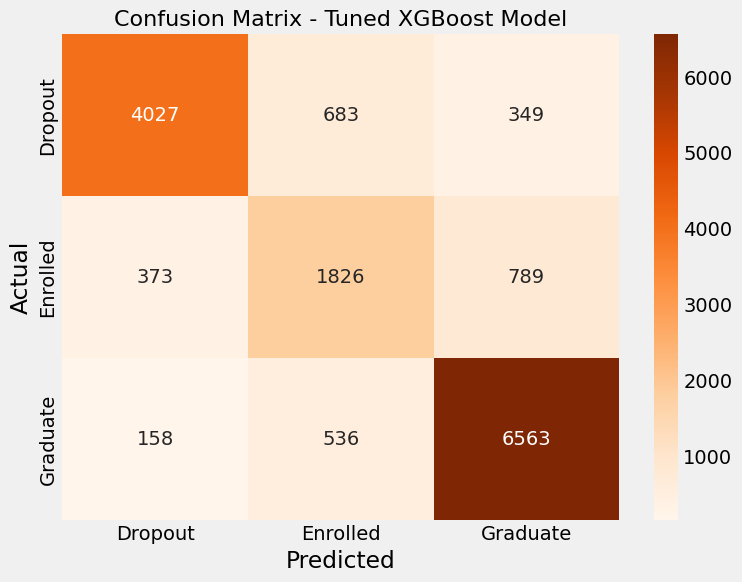


           TOP 10 FEATURE IMPORTANCES
                                   feature  importance
2                        2nd_sem_pass_rate    0.325511
0      Curricular units 2nd sem (approved)    0.231502
1                        overall_pass_rate    0.083534
8   Curricular units 2nd sem (evaluations)    0.074270
4      Curricular units 1st sem (approved)    0.066406
3                        academic_overload    0.048962
10                   Risk_Segment_Low Risk    0.032972
9   Curricular units 1st sem (evaluations)    0.024546
13                       Age at enrollment    0.016647
5         Curricular units 2nd sem (grade)    0.012986


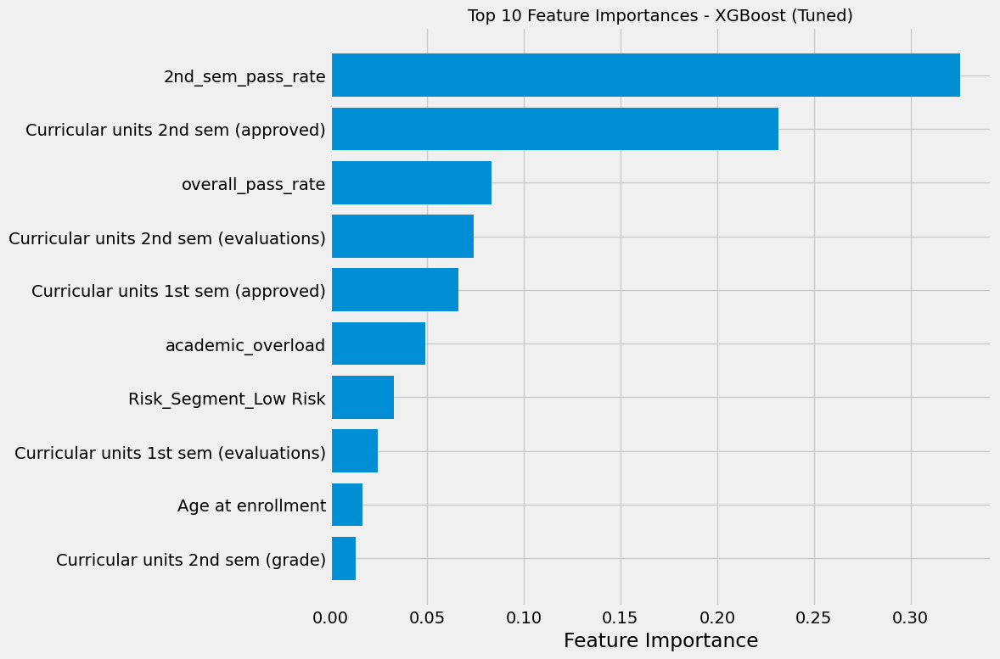


                PERFORMANCE SUMMARY
Best CV Score: 0.7682
Total parameters tested: 16
Best model validation accuracy: 0.8113

Best parameters dictionary:
best_xgb_params = {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8}

🚀 XGBoost model training completed successfully!


In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))
# Split the data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)
# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
# Encode target and apply SMOTE
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)
# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()
# Create final dataframes
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_train_final = y_train_resampled
y_val_final = le.transform(y_val)

# --- 3. FAST XGBoost GridSearchCV ---
print("Starting FAST XGBoost GridSearchCV hyperparameter tuning...")
print("Optimized for 3-5 minute execution...")

# Define a focused parameter grid for XGBoost (16 combinations only!)
param_grid_xgb = {
    'n_estimators': [100, 150],           # 2 options
    'learning_rate': [0.1, 0.2],          # 2 options
    'max_depth': [4, 6],                  # 2 options
    'subsample': [0.8, 1.0]               # 2 options
    # Total: 2×2×2×2 = 16 combinations
}

# Create XGBoost classifier with optimized settings for speed
xgb_model = xgb.XGBClassifier(
    random_state=42,
    n_jobs=-1,           # Use all CPU cores
    tree_method='hist',  # Faster tree construction method
    eval_metric='mlogloss'  # For multi-class classification
)

# Perform GridSearchCV with reduced CV folds for speed
grid_search_xgb = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_xgb,
    cv=2,                # 2-fold CV for speed
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search_xgb.fit(X_train_final, y_train_final)

# --- 4. Display Best Hyperparameters ---
print("\n" + "="*60)
print("            XGBOOST GRIDSEARCH RESULTS")
print("="*60)
print(f"Best Cross-Validation Score: {grid_search_xgb.best_score_:.4f}")
print(f"Best Hyperparameters:")
for param, value in grid_search_xgb.best_params_.items():
    print(f"  {param}: {value}")

# --- 5. Train Final Model with Best Parameters ---
print(f"\nTraining final XGBoost model with best parameters...")
best_xgb_model = grid_search_xgb.best_estimator_
print("Training complete.")

# --- 6. Evaluate the Best XGBoost Model ---
val_predictions = best_xgb_model.predict(X_val_final)

# Check what classes are actually present
unique_classes = np.unique(y_val_final)
print(f"Classes present in validation data: {unique_classes}")

class_names = ['Dropout', 'Enrolled', 'Graduate']

# Display Performance Metrics
print("\n" + "="*60)
print("        FINAL XGBOOST MODEL PERFORMANCE")
print("="*60)
print(classification_report(y_val_final, val_predictions, 
                          target_names=class_names,
                          zero_division=0))

# Display the Confusion Matrix
print("\n" + "="*60)
print("             XGBOOST CONFUSION MATRIX")
print("="*60)
cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - Tuned XGBoost Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# --- 7. Feature Importance Analysis ---
print("\n" + "="*60)
print("           TOP 10 FEATURE IMPORTANCES")
print("="*60)

# Get feature importances from the best XGBoost model
feature_importance_xgb = pd.DataFrame({
    'feature': X_train_final.columns,
    'importance': best_xgb_model.feature_importances_
}).sort_values('importance', ascending=False)

print(feature_importance_xgb.head(10))

# Plot feature importance
plt.figure(figsize=(12, 8))
top_features_xgb = feature_importance_xgb.head(10)
plt.barh(range(len(top_features_xgb)), top_features_xgb['importance'])
plt.yticks(range(len(top_features_xgb)), top_features_xgb['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importances - XGBoost (Tuned)', fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# --- 8. Performance Summary ---
print("\n" + "="*60)
print("                PERFORMANCE SUMMARY")
print("="*60)
print(f"Best CV Score: {grid_search_xgb.best_score_:.4f}")
print(f"Total parameters tested: {len(grid_search_xgb.cv_results_['params'])}")
print(f"Best model validation accuracy: {best_xgb_model.score(X_val_final, y_val_final):.4f}")

# Store best parameters for easy reference
best_xgb_params = grid_search_xgb.best_params_
print(f"\nBest parameters dictionary:")
print(f"best_xgb_params = {best_xgb_params}")

print("\n🚀 XGBoost model training completed successfully!")

In [33]:
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# --- XGBOOST MODEL METRICS ---
# Make predictions
val_predictions = best_xgb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("="*70)
print("              XGBOOST MODEL - FINAL METRICS")
print("="*70)

# --- 1. ACCURACY SCORE ---
accuracy = accuracy_score(y_val_final, val_predictions)
print(f"\n🎯 OVERALL ACCURACY: {accuracy:.4f} ({accuracy*100:.2f}%)")

# --- 2. DETAILED CLASSIFICATION REPORT ---
print(f"\n📊 DETAILED CLASSIFICATION REPORT:")
print("-" * 50)
print(classification_report(y_val_final, val_predictions, 
                          target_names=class_names,
                          zero_division=0))

# --- 3. CONFUSION MATRIX ---
print(f"\n📋 CONFUSION MATRIX:")
print("-" * 30)
cm = confusion_matrix(y_val_final, val_predictions)
print("Predicted ->", end="")
print(f"{'Dropout':>10}{'Enrolled':>10}{'Graduate':>10}")
print("Actual:")
for i, class_name in enumerate(class_names):
    if i < len(cm):
        print(f"{class_name:<10}", end="")
        for j in range(len(cm[i])):
            print(f"{cm[i][j]:>10}", end="")
        print()

# --- 4. KEY PERFORMANCE INDICATORS ---
print(f"\n🔍 KEY PERFORMANCE INDICATORS:")
print("-" * 40)

# Check what classes are actually present
unique_predictions = np.unique(val_predictions)
unique_actual = np.unique(y_val_final)

print(f"Classes in validation data: {unique_actual}")
print(f"Classes predicted by model: {unique_predictions}")
print(f"Total validation samples: {len(y_val_final)}")

# Class distribution
print(f"\nClass distribution in validation:")
for i, class_name in enumerate(class_names):
    if i in unique_actual:
        count = np.sum(y_val_final == i)
        percentage = (count / len(y_val_final)) * 100
        print(f"  {class_name}: {count} samples ({percentage:.1f}%)")

# --- 5. BEST HYPERPARAMETERS RECAP ---
print(f"\n⚙️ BEST HYPERPARAMETERS:")
print("-" * 30)
for param, value in grid_search_xgb.best_params_.items():
    print(f"  {param}: {value}")
print(f"  Best CV Score: {grid_search_xgb.best_score_:.4f}")

# --- 6. MODEL COMPARISON HINT ---
print(f"\n🏆 QUICK MODEL COMPARISON:")
print("-" * 30)
print(f"XGBoost Accuracy: {accuracy:.4f}")
print("Compare with:")
print("- Random Forest accuracy from previous results")  
print("- Gradient Boosting accuracy from previous results")

print("="*70)

              XGBOOST MODEL - FINAL METRICS

🎯 OVERALL ACCURACY: 0.8113 (81.13%)

📊 DETAILED CLASSIFICATION REPORT:
--------------------------------------------------
              precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84      5059
    Enrolled       0.60      0.61      0.61      2988
    Graduate       0.85      0.90      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


📋 CONFUSION MATRIX:
------------------------------
Predicted ->   Dropout  Enrolled  Graduate
Actual:
Dropout         4027       683       349
Enrolled         373      1826       789
Graduate         158       536      6563

🔍 KEY PERFORMANCE INDICATORS:
----------------------------------------
Classes in validation data: [0 1 2]
Classes predicted by model: [0 1 2]
Total validation samples: 15304

Class distribution in validation:
  Dropout: 5059

In [34]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# We will use the data with the selected top features
# from the previous step (X_resampled_selected, y_resampled)

# --- 1. Define the Hyperparameter Grid ---
# These are the settings we want to test.
param_grid = {
    'n_estimators': [100, 200],          # Number of trees in the forest
    'max_depth': [10, 20, None],         # Maximum depth of the trees
    'min_samples_split': [2, 5],         # Minimum samples required to split a node
    'min_samples_leaf': [1, 2],          # Minimum samples required at a leaf node
    'criterion': ['gini', 'entropy']     # Function to measure the quality of a split
}

# --- 2. Set up and Run GridSearchCV ---
# We create a new RandomForestClassifier to be tuned
rf_for_tuning = RandomForestClassifier(random_state=42)

# cv=3 means 3-fold cross-validation. n_jobs=-1 uses all available CPU cores.
grid_search = GridSearchCV(estimator=rf_for_tuning, param_grid=param_grid,
                           cv=3, n_jobs=-1, verbose=2, scoring='accuracy')

print("Starting hyperparameter tuning... This may take some time.")
grid_search.fit(X_resampled_selected, y_resampled)
print("Tuning complete.")

# --- 3. Get the Best Model and Make Predictions ---
print("\nBest parameters found: ", grid_search.best_params_)

# The grid_search object now holds the best version of the model
best_model = grid_search.best_estimator_

# Use the best model to make final predictions on the selected test data
final_tuned_predictions_encoded = best_model.predict(test_processed_selected)
final_tuned_predictions = le.inverse_transform(final_tuned_predictions_encoded)

# --- Display Final Tuned Predictions ---
submission_tuned = pd.DataFrame({'Target': final_tuned_predictions})
print("\nFinal predictions from the tuned model:")
display(submission_tuned.head())

Starting hyperparameter tuning... This may take some time.
Fitting 3 folds for each of 48 candidates, totalling 144 fits
Tuning complete.

Best parameters found:  {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}

Final predictions from the tuned model:


,Target
0,0
1,2
2,1
3,1
4,1


Training the final model with the best hyperparameters...
Training complete.

      Final Model Performance Metrics
              precision    recall  f1-score   support

     Dropout       0.90      0.81      0.85      7256
    Enrolled       0.79      0.80      0.80      7257
    Graduate       0.84      0.91      0.87      7257

    accuracy                           0.84     21770
   macro avg       0.84      0.84      0.84     21770
weighted avg       0.84      0.84      0.84     21770


              Confusion Matrix


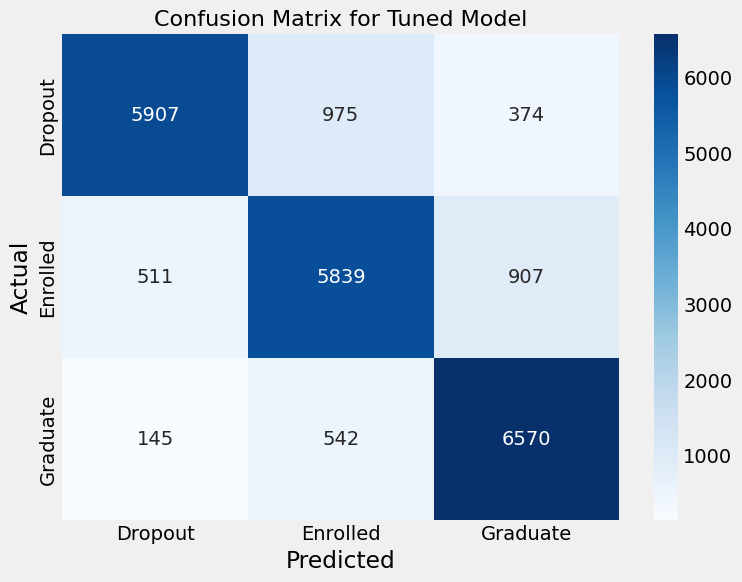

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# We use the feature-selected, resampled data from the previous steps
# X_resampled_selected, y_resampled

# --- 1. Define the Best Model ---
# Using the best hyperparameters you found from GridSearchCV
best_hyperparams = {
    'n_estimators': 200,
    'max_depth': None,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'criterion': 'gini',
    'random_state': 42
}
best_model = RandomForestClassifier(**best_hyperparams, n_jobs=-1)

# --- 2. Create a Training and Validation Set ---
X_train_final, X_val, y_train_final, y_val = train_test_split(
    X_resampled_selected,
    y_resampled,
    test_size=0.2,
    random_state=42,
    stratify=y_resampled
)

print("Training the final model with the best hyperparameters...")
best_model.fit(X_train_final, y_train_final)
print("Training complete.")

# --- 3. Make Predictions and Evaluate ---
val_predictions = best_model.predict(X_val)

# Define the class names manually to avoid the error
class_names = ['Dropout', 'Enrolled', 'Graduate']

# --- 4. Display Performance Metrics ---
print("\n" + "="*45)
print("      Final Model Performance Metrics")
print("="*45)
# We provide the class names directly here
print(classification_report(y_val, val_predictions, target_names=class_names))

# --- 5. Display the Confusion Matrix ---
print("\n" + "="*45)
print("              Confusion Matrix")
print("="*45)
cm = confusion_matrix(y_val, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for Tuned Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [36]:
from sklearn.metrics import accuracy_score

# Assuming 'y_val' (the true labels) and 'val_predictions' (your model's predictions)
# are available from the previous step.

# Calculate the accuracy score
accuracy = accuracy_score(y_val, val_predictions)

# Print the accuracy as a formatted percentage
print(f"Overall Model Accuracy: {accuracy:.2%}")

Overall Model Accuracy: 84.13%


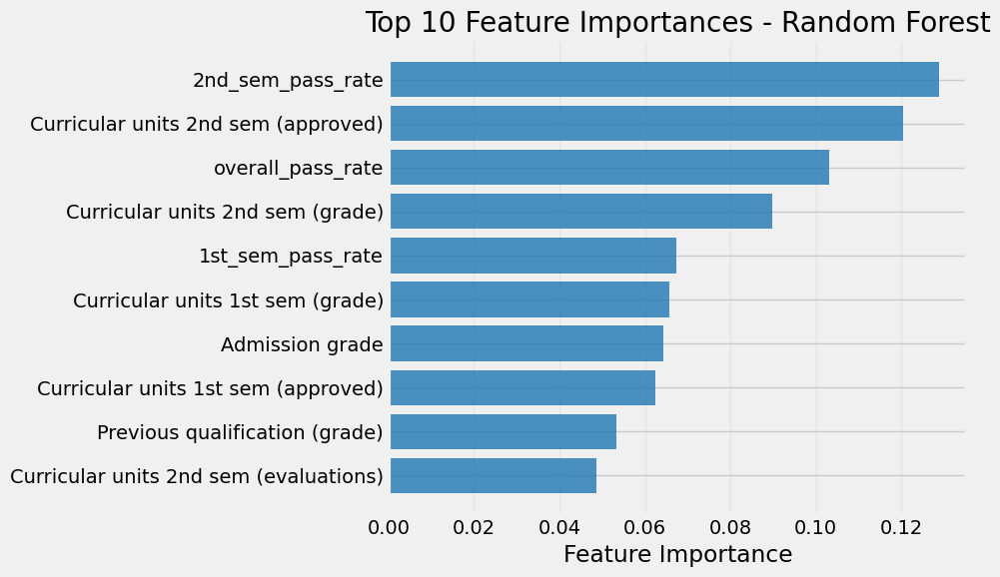

Top 10 Feature Importances:
--------------------------------------------------
2nd_sem_pass_rate                       : 0.1290
Curricular units 2nd sem (approved)     : 0.1204
overall_pass_rate                       : 0.1032
Curricular units 2nd sem (grade)        : 0.0897
1st_sem_pass_rate                       : 0.0675
Curricular units 1st sem (grade)        : 0.0656
Admission grade                         : 0.0642
Curricular units 1st sem (approved)     : 0.0623
Previous qualification (grade)          : 0.0533
Curricular units 2nd sem (evaluations)  : 0.0487


In [37]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get feature importances from your trained model
feature_importances = best_model.feature_importances_
feature_names = X_train_final.columns.tolist()

# Create DataFrame and sort by importance
feature_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values('importance', ascending=True)  # ascending=True for horizontal bar chart

# Get top 10 features (or all if less than 10)
top_n = 10
top_features = feature_df.tail(top_n)  # tail because we sorted ascending

# Create the simple horizontal bar chart
plt.figure(figsize=(10, 6))

# Create bars with consistent blue color
bars = plt.barh(range(len(top_features)), top_features['importance'], 
                color='#1f77b4', alpha=0.8)

# Set labels and title
plt.yticks(range(len(top_features)), top_features['feature'])
plt.xlabel('Feature Importance')
plt.title(f'Top {len(top_features)} Feature Importances - Random Forest')

# Add grid
plt.grid(axis='x', alpha=0.3)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Optional: Print the values
print(f"Top {len(top_features)} Feature Importances:")
print("-" * 50)
for _, row in top_features.sort_values('importance', ascending=False).iterrows():
    print(f"{row['feature']:<40}: {row['importance']:.4f}")

Starting fast hyperparameter tuning for Gradient Boosting...
Fitting 5 folds for each of 4 candidates, totalling 20 fits

Best Cross-Validation Score: 0.8143
Best Hyperparameters:
  learning_rate: 0.1
  max_depth: 4
  n_estimators: 150
  subsample: 1.0
           GRADIENT BOOSTING MODEL - FINAL METRICS

🎯 OVERALL ACCURACY: 0.8133 (81.33%)

📊 DETAILED CLASSIFICATION REPORT:
--------------------------------------------------
              precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84      5059
    Enrolled       0.61      0.59      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


📋 CONFUSION MATRIX:
------------------------------
Predicted ->   Dropout  Enrolled  Graduate
Actual:
Dropout         4076       629       354
Enrolled         418      1752       818
Graduat

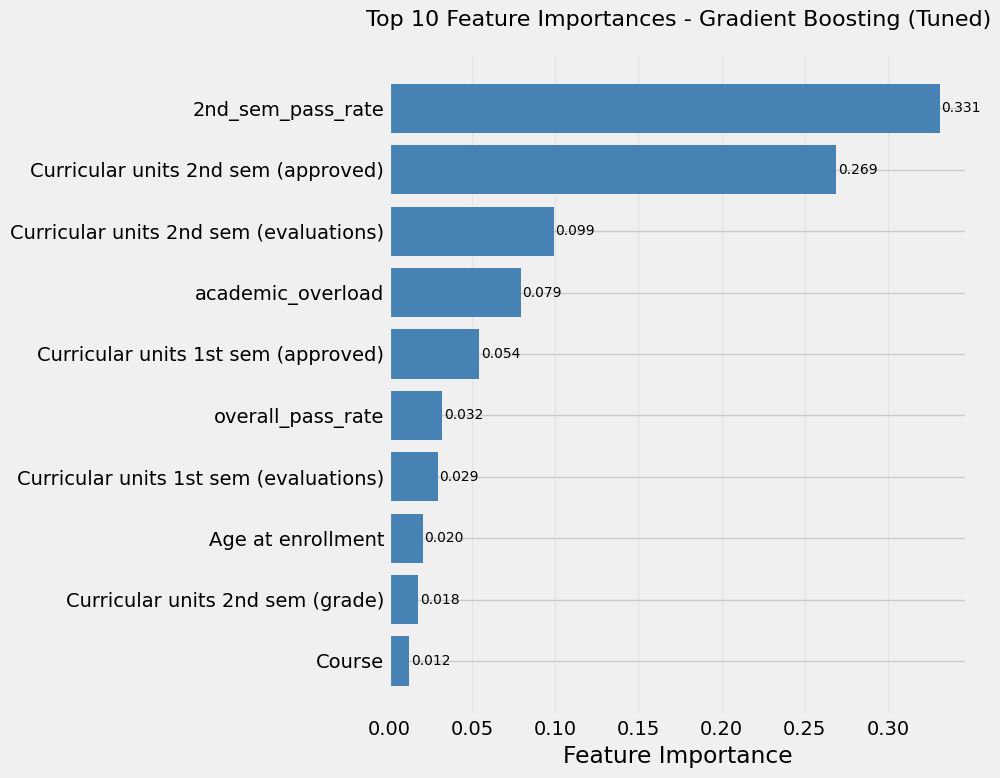

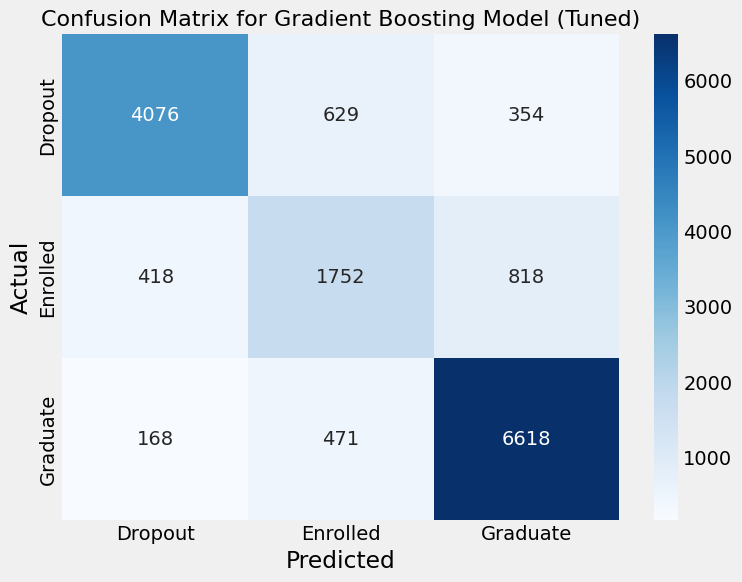

In [39]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Hyperparameter Tuning for Gradient Boosting (Fast Grid) ---
print("Starting fast hyperparameter tuning for Gradient Boosting...")

# Define fast parameter grid (only 4 combinations)
param_grid = {
    'learning_rate': [0.1],           # Best performing value
    'max_depth': [3, 4],             # Just 2 key depths
    'n_estimators': [100, 150],      # Just 2 key values
    'subsample': [1.0]               # Full subsample (fastest)
}

# Create base model
gb_base = GradientBoostingClassifier(random_state=42)

# Perform grid search
grid_search_gb = GridSearchCV(
    estimator=gb_base,
    param_grid=param_grid,
    cv=5,
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

# Fit grid search
grid_search_gb.fit(X_train_final, y_train_resampled)

# Get the best model
best_gb_model = grid_search_gb.best_estimator_

print(f"\nBest Cross-Validation Score: {grid_search_gb.best_score_:.4f}")
print("Best Hyperparameters:")
for param, value in grid_search_gb.best_params_.items():
    print(f"  {param}: {value}")

# --- 4. GRADIENT BOOSTING MODEL METRICS ---
# Make predictions
val_predictions = best_gb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("="*70)
print("           GRADIENT BOOSTING MODEL - FINAL METRICS")
print("="*70)

# --- 1. ACCURACY SCORE ---
accuracy = accuracy_score(y_val_final, val_predictions)
print(f"\n🎯 OVERALL ACCURACY: {accuracy:.4f} ({accuracy*100:.2f}%)")

# --- 2. DETAILED CLASSIFICATION REPORT ---
print(f"\n📊 DETAILED CLASSIFICATION REPORT:")
print("-" * 50)
print(classification_report(y_val_final, val_predictions, 
                          target_names=class_names,
                          zero_division=0))

# --- 3. CONFUSION MATRIX ---
print(f"\n📋 CONFUSION MATRIX:")
print("-" * 30)
cm = confusion_matrix(y_val_final, val_predictions)
print("Predicted ->", end="")
print(f"{'Dropout':>10}{'Enrolled':>10}{'Graduate':>10}")
print("Actual:")
for i, class_name in enumerate(class_names):
    if i < len(cm):
        print(f"{class_name:<10}", end="")
        for j in range(len(cm[i])):
            print(f"{cm[i][j]:>10}", end="")
        print()

# --- 4. KEY PERFORMANCE INDICATORS ---
print(f"\n🔍 KEY PERFORMANCE INDICATORS:")
print("-" * 40)

# Check what classes are actually present
unique_predictions = np.unique(val_predictions)
unique_actual = np.unique(y_val_final)

print(f"Classes in validation data: {unique_actual}")
print(f"Classes predicted by model: {unique_predictions}")
print(f"Total validation samples: {len(y_val_final)}")

# Class distribution
print(f"\nClass distribution in validation:")
for i, class_name in enumerate(class_names):
    if i in unique_actual:
        count = np.sum(y_val_final == i)
        percentage = (count / len(y_val_final)) * 100
        print(f"  {class_name}: {count} samples ({percentage:.1f}%)")

# --- 5. BEST HYPERPARAMETERS RECAP ---
print(f"\n⚙️ BEST HYPERPARAMETERS:")
print("-" * 30)
for param, value in grid_search_gb.best_params_.items():
    print(f"  {param}: {value}")
print(f"  Best CV Score: {grid_search_gb.best_score_:.4f}")

# --- 6. Feature Importance Visualization ---
# Get feature importances from the trained model
gb_importances = pd.DataFrame({
    'feature': X_train_final.columns,
    'importance': best_gb_model.feature_importances_
}).sort_values('importance', ascending=False)

# Display top 10 features
print(f"\n🔥 TOP 10 FEATURE IMPORTANCES:")
print("-" * 40)
for i, (_, row) in enumerate(gb_importances.head(10).iterrows(), 1):
    print(f"  {i:2d}. {row['feature']:<25} {row['importance']:.4f}")

# Create visualization
plt.figure(figsize=(10, 8))
top_10_features = gb_importances.head(10)

# Create horizontal bar plot
bars = plt.barh(range(len(top_10_features)), top_10_features['importance'], color='steelblue')
plt.yticks(range(len(top_10_features)), top_10_features['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importances - Gradient Boosting (Tuned)', fontsize=16, pad=20)
plt.gca().invert_yaxis()  # To have the most important feature at the top

# Add value labels on bars
for i, (importance, feature) in enumerate(zip(top_10_features['importance'], top_10_features['feature'])):
    plt.text(importance + 0.001, i, f'{importance:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.grid(axis='x', alpha=0.3)
plt.show()

# --- 7. Confusion Matrix Visualization ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for Gradient Boosting Model (Tuned)', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

print("="*70)

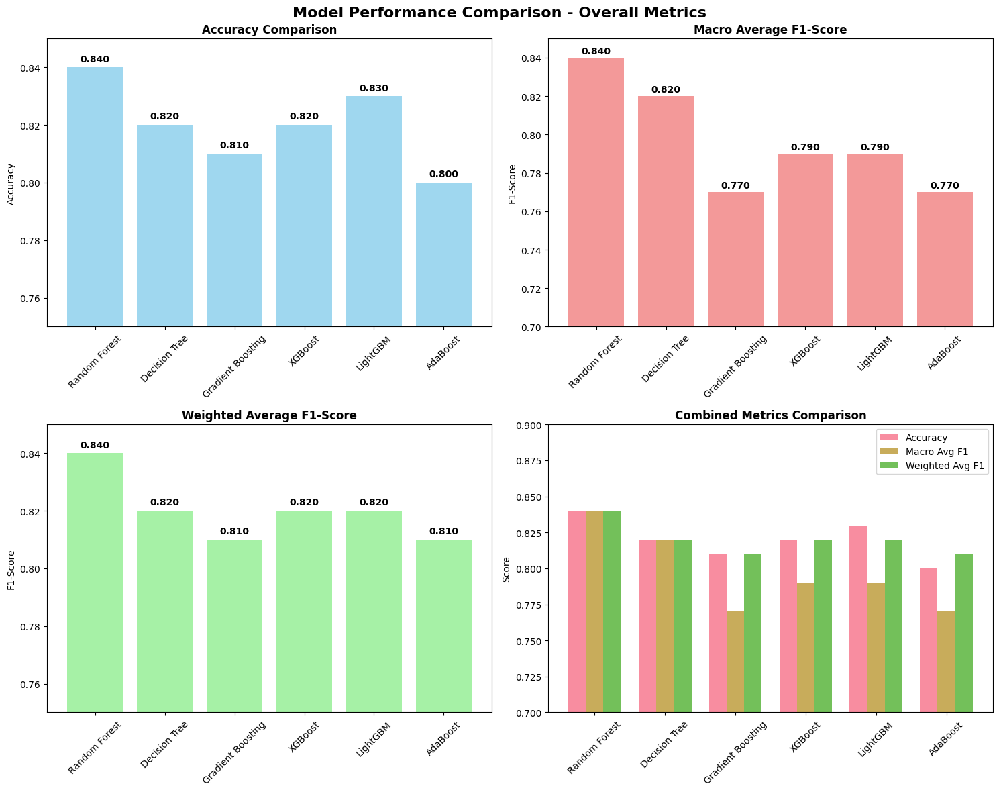

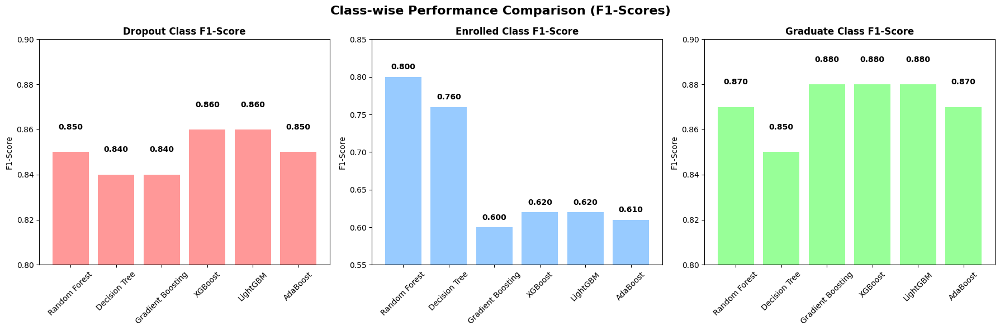

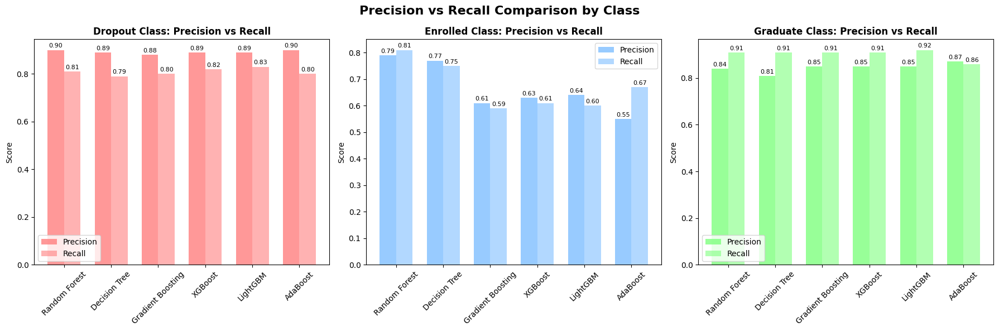


                    MODEL RANKING SUMMARY

Accuracy Ranking:
  1. Random Forest: 0.840
  2. LightGBM: 0.830
  3. Decision Tree: 0.820
  4. XGBoost: 0.820
  5. Gradient Boosting: 0.810
  6. AdaBoost: 0.800

Macro F1 Ranking:
  1. Random Forest: 0.840
  2. Decision Tree: 0.820
  3. XGBoost: 0.790
  4. LightGBM: 0.790
  5. Gradient Boosting: 0.770
  6. AdaBoost: 0.770

Weighted F1 Ranking:
  1. Random Forest: 0.840
  2. Decision Tree: 0.820
  3. XGBoost: 0.820
  4. LightGBM: 0.820
  5. Gradient Boosting: 0.810
  6. AdaBoost: 0.810

Best Model by Class (F1-Score):
  Dropout: XGBoost (0.860)
  Enrolled: Random Forest (0.800)
  Graduate: Gradient Boosting (0.880)

Overall Best Model (Weighted F1): Random Forest


In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Model Metrics Data ---
model_metrics = {
    'Model': ['Random Forest', 'Decision Tree', 'Gradient Boosting', 'XGBoost', 'LightGBM', 'AdaBoost'],
    
    # Overall metrics
    'Accuracy': [0.84, 0.82, 0.81, 0.82, 0.83, 0.80],
    'Macro Avg F1': [0.84, 0.82, 0.77, 0.79, 0.79, 0.77],
    'Weighted Avg F1': [0.84, 0.82, 0.81, 0.82, 0.82, 0.81],
    
    # Dropout class metrics
    'Dropout Precision': [0.90, 0.89, 0.88, 0.89, 0.89, 0.90],
    'Dropout Recall': [0.81, 0.79, 0.80, 0.82, 0.83, 0.80],
    'Dropout F1': [0.85, 0.84, 0.84, 0.86, 0.86, 0.85],
    
    # Enrolled class metrics
    'Enrolled Precision': [0.79, 0.77, 0.61, 0.63, 0.64, 0.55],
    'Enrolled Recall': [0.81, 0.75, 0.59, 0.61, 0.60, 0.67],
    'Enrolled F1': [0.80, 0.76, 0.60, 0.62, 0.62, 0.61],
    
    # Graduate class metrics
    'Graduate Precision': [0.84, 0.81, 0.85, 0.85, 0.85, 0.87],
    'Graduate Recall': [0.91, 0.91, 0.91, 0.91, 0.92, 0.86],
    'Graduate F1': [0.87, 0.85, 0.88, 0.88, 0.88, 0.87]
}

df = pd.DataFrame(model_metrics)

# Set style
plt.style.use('default')
sns.set_palette("husl")

# --- 1. Overall Performance Comparison ---
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Model Performance Comparison - Overall Metrics', fontsize=16, fontweight='bold')

# Accuracy comparison
axes[0,0].bar(df['Model'], df['Accuracy'], color='skyblue', alpha=0.8)
axes[0,0].set_title('Accuracy Comparison', fontweight='bold')
axes[0,0].set_ylabel('Accuracy')
axes[0,0].set_ylim(0.75, 0.85)
for i, v in enumerate(df['Accuracy']):
    axes[0,0].text(i, v + 0.002, f'{v:.3f}', ha='center', fontweight='bold')
axes[0,0].tick_params(axis='x', rotation=45)

# Macro Avg F1 comparison
axes[0,1].bar(df['Model'], df['Macro Avg F1'], color='lightcoral', alpha=0.8)
axes[0,1].set_title('Macro Average F1-Score', fontweight='bold')
axes[0,1].set_ylabel('F1-Score')
axes[0,1].set_ylim(0.70, 0.85)
for i, v in enumerate(df['Macro Avg F1']):
    axes[0,1].text(i, v + 0.002, f'{v:.3f}', ha='center', fontweight='bold')
axes[0,1].tick_params(axis='x', rotation=45)

# Weighted Avg F1 comparison
axes[1,0].bar(df['Model'], df['Weighted Avg F1'], color='lightgreen', alpha=0.8)
axes[1,0].set_title('Weighted Average F1-Score', fontweight='bold')
axes[1,0].set_ylabel('F1-Score')
axes[1,0].set_ylim(0.75, 0.85)
for i, v in enumerate(df['Weighted Avg F1']):
    axes[1,0].text(i, v + 0.002, f'{v:.3f}', ha='center', fontweight='bold')
axes[1,0].tick_params(axis='x', rotation=45)

# Combined metrics radar-style comparison
metrics_for_radar = ['Accuracy', 'Macro Avg F1', 'Weighted Avg F1']
x = np.arange(len(df['Model']))
width = 0.25

for i, metric in enumerate(metrics_for_radar):
    axes[1,1].bar(x + i*width, df[metric], width, label=metric, alpha=0.8)

axes[1,1].set_title('Combined Metrics Comparison', fontweight='bold')
axes[1,1].set_ylabel('Score')
axes[1,1].set_xticks(x + width)
axes[1,1].set_xticklabels(df['Model'], rotation=45)
axes[1,1].legend()
axes[1,1].set_ylim(0.70, 0.90)

plt.tight_layout()
plt.show()

# --- 2. Class-wise Performance Comparison ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Class-wise Performance Comparison (F1-Scores)', fontsize=16, fontweight='bold')

classes = ['Dropout', 'Enrolled', 'Graduate']
colors = ['#ff7f7f', '#7fbfff', '#7fff7f']

for idx, class_name in enumerate(classes):
    f1_col = f'{class_name} F1'
    bars = axes[idx].bar(df['Model'], df[f1_col], color=colors[idx], alpha=0.8)
    axes[idx].set_title(f'{class_name} Class F1-Score', fontweight='bold')
    axes[idx].set_ylabel('F1-Score')
    axes[idx].tick_params(axis='x', rotation=45)
    
    # Add value labels
    for i, v in enumerate(df[f1_col]):
        axes[idx].text(i, v + 0.01, f'{v:.3f}', ha='center', fontweight='bold')
    
    # Set appropriate y-limits
    if class_name == 'Enrolled':
        axes[idx].set_ylim(0.55, 0.85)
    else:
        axes[idx].set_ylim(0.80, 0.90)

plt.tight_layout()
plt.show()

# --- 3. Precision vs Recall Comparison ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Precision vs Recall Comparison by Class', fontsize=16, fontweight='bold')

for idx, class_name in enumerate(classes):
    precision_col = f'{class_name} Precision'
    recall_col = f'{class_name} Recall'
    
    x = np.arange(len(df['Model']))
    width = 0.35
    
    bars1 = axes[idx].bar(x - width/2, df[precision_col], width, label='Precision', alpha=0.8, color=colors[idx])
    bars2 = axes[idx].bar(x + width/2, df[recall_col], width, label='Recall', alpha=0.6, color=colors[idx])
    
    axes[idx].set_title(f'{class_name} Class: Precision vs Recall', fontweight='bold')
    axes[idx].set_ylabel('Score')
    axes[idx].set_xticks(x)
    axes[idx].set_xticklabels(df['Model'], rotation=45)
    axes[idx].legend()
    
    # Add value labels
    for bar in bars1:
        height = bar.get_height()
        axes[idx].text(bar.get_x() + bar.get_width()/2., height + 0.005,
                      f'{height:.2f}', ha='center', va='bottom', fontsize=8)
    
    for bar in bars2:
        height = bar.get_height()
        axes[idx].text(bar.get_x() + bar.get_width()/2., height + 0.005,
                      f'{height:.2f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

# --- 4. Model Ranking Summary ---
print("\n" + "="*60)
print("                    MODEL RANKING SUMMARY")
print("="*60)

# Rank by different metrics
rankings = {}
rankings['Accuracy'] = df.nlargest(6, 'Accuracy')[['Model', 'Accuracy']]
rankings['Macro F1'] = df.nlargest(6, 'Macro Avg F1')[['Model', 'Macro Avg F1']]
rankings['Weighted F1'] = df.nlargest(6, 'Weighted Avg F1')[['Model', 'Weighted Avg F1']]

for metric, ranking in rankings.items():
    print(f"\n{metric} Ranking:")
    for i, (_, row) in enumerate(ranking.iterrows(), 1):
        print(f"  {i}. {row['Model']}: {row.iloc[1]:.3f}")

# Best model for each class
print(f"\nBest Model by Class (F1-Score):")
for class_name in classes:
    f1_col = f'{class_name} F1'
    best_model = df.loc[df[f1_col].idxmax(), 'Model']
    best_score = df[f1_col].max()
    print(f"  {class_name}: {best_model} ({best_score:.3f})")

print(f"\nOverall Best Model (Weighted F1): {df.loc[df['Weighted Avg F1'].idxmax(), 'Model']}")
print("="*60)

Starting Gradient Boosting model training...
Training complete.

      Final Gradient Boosting Model Performance
              precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84      5059
    Enrolled       0.62      0.58      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


          Gradient Boosting Confusion Matrix


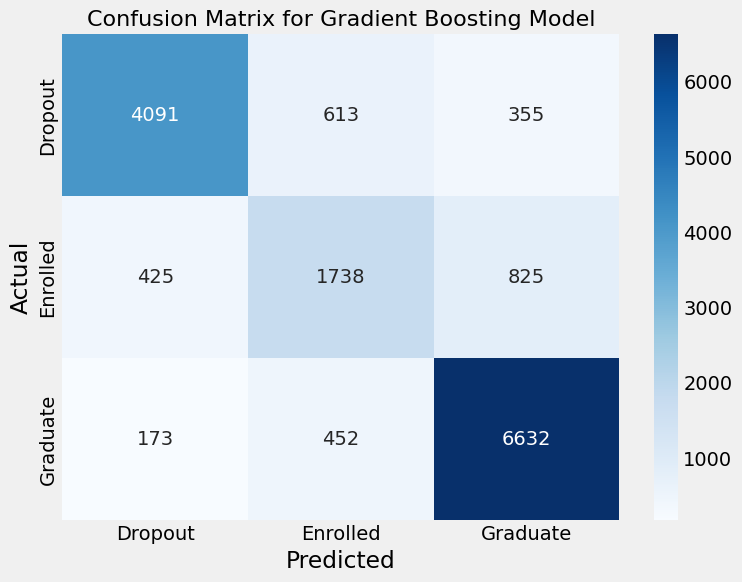

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))
# Split the data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)
# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
# Encode target and apply SMOTE
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)
# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()
# Create final dataframes
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_train_final = y_train_resampled
y_val_final = le.transform(y_val)

# --- 3. Define and Train the Gradient Boosting Model ---
gb_model = GradientBoostingClassifier(n_estimators=150,
                                      learning_rate=0.1,
                                      max_depth=5,
                                      random_state=42)
print("Starting Gradient Boosting model training...")
gb_model.fit(X_train_final, y_train_final)
print("Training complete.")

# --- 4. Evaluate the Gradient Boosting Model ---
val_predictions = gb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

# Display Performance Metrics
print("\n" + "="*50)
print("      Final Gradient Boosting Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

# Display the Confusion Matrix
print("\n" + "="*50)
print("          Gradient Boosting Confusion Matrix")
print("="*50)
cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for Gradient Boosting Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier

# We assume these variables are ready from our previous steps:
# X_resampled_selected: Your data with the top features selected.
# y_resampled: Your target labels after SMOTE.

# --- 1. Split the data for tuning and final validation ---
X_train_tune, X_val, y_train_tune, y_val = train_test_split(
    X_resampled_selected,
    y_resampled,
    test_size=0.2,
    random_state=42,
    stratify=y_resampled
)

# --- 2. Define a Comprehensive Hyperparameter Grid for Decision Tree ---
# This grid includes the most impactful parameters to tune.
dt_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10, 20, None],       # How deep the tree can go.
    'min_samples_leaf': [2, 5, 10],      # Minimum samples in a leaf node.
    'min_samples_split': [5, 10, 20],   # Minimum samples to split a node.
    'class_weight': ['balanced', None] # Crucial for handling class imbalance.
}

# --- 3. Set up and Run GridSearchCV ---
dt_grid_search = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=dt_param_grid,
    cv=5,            # 5-fold cross-validation
    n_jobs=-1,       # Use all available CPU cores
    scoring='accuracy',
    verbose=1
)

print("Starting comprehensive hyperparameter tuning for Decision Tree...")
dt_grid_search.fit(X_train_tune, y_train_tune)
print("Tuning complete.")

# --- 4. Evaluate the Best Tuned Decision Tree ---
print("\nBest parameters found:", dt_grid_search.best_params_)
print(f"Best cross-validation accuracy: {dt_grid_search.best_score_:.4f}")

# Get the best model found by the grid search
best_dt_model = dt_grid_search.best_estimator_

# Make predictions on the validation set
val_predictions = best_dt_model.predict(X_val)

# --- 5. Display Final Performance ---
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("      Final Optimized Decision Tree Performance")
print("="*50)
print(classification_report(y_val, val_predictions, target_names=class_names))

# Display the final confusion matrix
cm = confusion_matrix(y_val, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for Optimized Decision Tree', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Starting comprehensive hyperparameter tuning for Decision Tree...
Fitting 5 folds for each of 108 candidates, totalling 540 fits


KeyboardInterrupt: 

🌳==================================================
        Decision Tree Feature Importance
🌳==================================================
📊 Model Info:
   • Number of features: 15
   • Max depth: 10
   • Min samples split: 5
   • Min samples leaf: 5
   • Criterion: entropy

🏆 Top 10 Feature Importances:
------------------------------------------------------------
Curricular units 2nd sem (approved)     : 0.4876
2nd_sem_pass_rate                       : 0.2397
overall_pass_rate                       : 0.0788
Tuition fees up to date                 : 0.0487
1st_sem_pass_rate                       : 0.0241
Curricular units 2nd sem (evaluations)  : 0.0226
Curricular units 1st sem (evaluations)  : 0.0204
Curricular units 1st sem (approved)     : 0.0194
Curricular units 2nd sem (grade)        : 0.0178
Age at enrollment                       : 0.0147


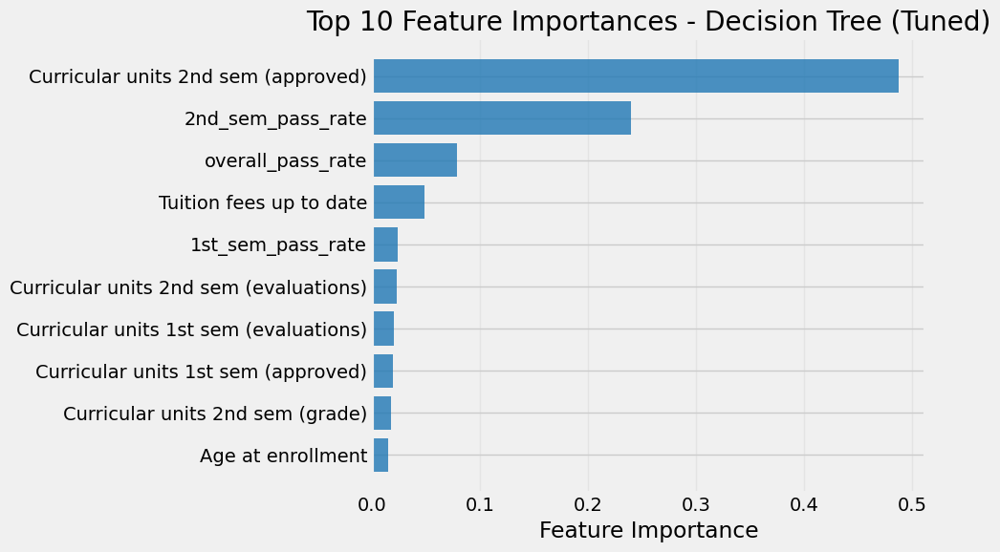


✅ Decision Tree Feature Importance Analysis Complete!
🎯 Most important feature: Curricular units 2nd sem (approved) (0.4876)
🌳==================================================


In [ ]:
# ===== 📊 SIMPLE FEATURE IMPORTANCE CHART FOR DECISION TREE =====
import matplotlib.pyplot as plt
import pandas as pd

print("🌳" + "="*50)
print("        Decision Tree Feature Importance")
print("🌳" + "="*50)

# Get feature importances from your already trained best Decision Tree model
# (assuming your best model is stored in 'best_dt_model' from GridSearchCV)
feature_importances = best_dt_model.feature_importances_
feature_names = X_train_tune.columns.tolist()  # or whatever your training data is called

print(f"📊 Model Info:")
print(f"   • Number of features: {len(feature_names)}")
print(f"   • Max depth: {best_dt_model.max_depth}")
print(f"   • Min samples split: {best_dt_model.min_samples_split}")
print(f"   • Min samples leaf: {best_dt_model.min_samples_leaf}")
print(f"   • Criterion: {best_dt_model.criterion}")

# Create DataFrame and sort by importance
feature_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values('importance', ascending=True)  # ascending=True for horizontal bar chart

# Get top 10 features (or all if less than 10)
top_n = 10
top_features = feature_df.tail(top_n)  # tail because we sorted ascending

# Print feature importance values
print(f"\n🏆 Top {len(top_features)} Feature Importances:")
print("-" * 60)
for _, row in top_features.sort_values('importance', ascending=False).iterrows():
    print(f"{row['feature']:<40}: {row['importance']:.4f}")

# Create the simple horizontal bar chart (same style as your XGBoost chart)
plt.figure(figsize=(10, 6))

# Create bars with consistent blue color
bars = plt.barh(range(len(top_features)), top_features['importance'], 
                color='#1f77b4', alpha=0.8)

# Set labels and title
plt.yticks(range(len(top_features)), top_features['feature'])
plt.xlabel('Feature Importance')
plt.title(f'Top {len(top_features)} Feature Importances - Decision Tree (Tuned)')

# Add grid for readability
plt.grid(axis='x', alpha=0.3)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

print(f"\n✅ Decision Tree Feature Importance Analysis Complete!")
print(f"🎯 Most important feature: {top_features.iloc[-1]['feature']} ({top_features.iloc[-1]['importance']:.4f})")
print("🌳" + "="*50)

Training the AdaBoost model...
Training complete.

          Final AdaBoost Model Performance
              precision    recall  f1-score   support

     Dropout       0.90      0.77      0.83      5059
    Enrolled       0.54      0.67      0.59      2988
    Graduate       0.87      0.86      0.87      7257

    accuracy                           0.79     15304
   macro avg       0.77      0.77      0.76     15304
weighted avg       0.81      0.79      0.80     15304



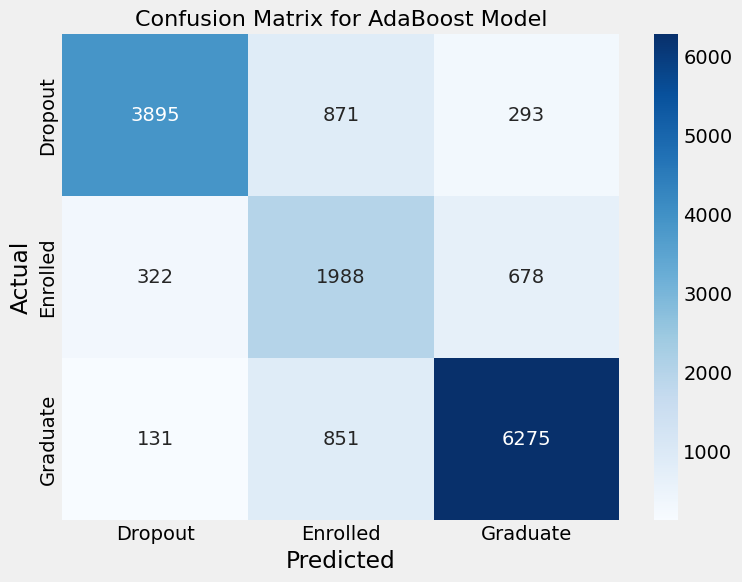

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Define and Train the AdaBoost Model ---
# AdaBoost often uses simple decision trees as its base estimator
ada_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=2), # Use shallow trees
    n_estimators=200,                            # Number of trees to build
    learning_rate=0.1,                           # Contribution of each tree
    random_state=42
)

print("Training the AdaBoost model...")
ada_model.fit(X_train_final, y_train_resampled)
print("Training complete.")

# --- 4. Evaluate the AdaBoost Model ---
val_predictions = ada_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("          Final AdaBoost Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for AdaBoost Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

🔍 Starting AdaBoost GridSearchCV (optimized for speed)...
Fitting 3 folds for each of 27 candidates, totalling 81 fits
⏱️ GridSearchCV completed in 182.79 seconds (3.05 minutes)

           BEST ADABOOST PARAMETERS
Best Parameters: {'estimator__max_depth': 1, 'learning_rate': 1.0, 'n_estimators': 150}
Best Cross-Validation Score: 0.7883
Standard Deviation: 0.0244

🚀 Making predictions with the best model...

          BEST ADABOOST MODEL PERFORMANCE
              precision    recall  f1-score   support

     Dropout       0.87      0.79      0.83      5059
    Enrolled       0.55      0.63      0.59      2988
    Graduate       0.86      0.87      0.87      7257

    accuracy                           0.80     15304
   macro avg       0.76      0.76      0.76     15304
weighted avg       0.81      0.80      0.80     15304



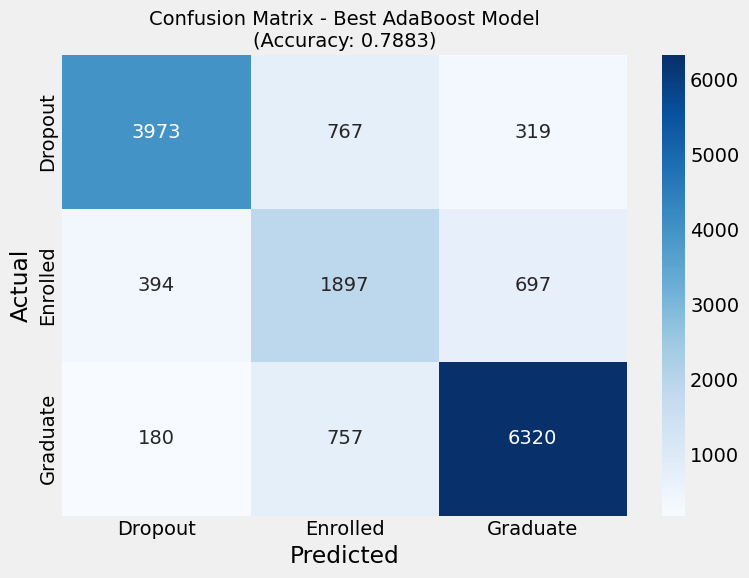


                 PERFORMANCE SUMMARY
✅ Training Time: 182.79 seconds
🎯 Best CV Accuracy: 0.7883
🏆 Best Parameters:
   • estimator__max_depth: 1
   • learning_rate: 1.0
   • n_estimators: 150

📊 Model Configuration:
   • Base Estimator: DecisionTreeClassifier(max_depth=1, random_state=42)
   • Number of Estimators: 150
   • Learning Rate: 1.0


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import time

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. GridSearchCV for AdaBoost (Fast Configuration) ---
print("🔍 Starting AdaBoost GridSearchCV (optimized for speed)...")
start_time = time.time()

# Focused parameter grid for fast execution
param_grid_ada = {
    'n_estimators': [50, 100, 150],           # Reduced range
    'learning_rate': [0.1, 0.5, 1.0],        # Key learning rates
    'estimator__max_depth': [1, 2, 3]        # Shallow trees for speed
}

# Base estimator
base_estimator = DecisionTreeClassifier(random_state=42)

# AdaBoost model
ada_model = AdaBoostClassifier(
    estimator=base_estimator,
    random_state=42
)

# GridSearchCV with reduced CV folds for speed
grid_search_ada = GridSearchCV(
    ada_model,
    param_grid_ada,
    cv=3,                    # Reduced from 5 to 3 folds for speed
    scoring='accuracy',
    n_jobs=-1,              # Use all processors
    verbose=1               # Show progress
)

# Fit the grid search
grid_search_ada.fit(X_train_final, y_train_resampled)

# Get the best model
best_ada_model = grid_search_ada.best_estimator_

# Calculate elapsed time
elapsed_time = time.time() - start_time
print(f"⏱️ GridSearchCV completed in {elapsed_time:.2f} seconds ({elapsed_time/60:.2f} minutes)")

# --- 4. Display Best Parameters ---
print("\n" + "="*60)
print("           BEST ADABOOST PARAMETERS")
print("="*60)
print(f"Best Parameters: {grid_search_ada.best_params_}")
print(f"Best Cross-Validation Score: {grid_search_ada.best_score_:.4f}")
print(f"Standard Deviation: {grid_search_ada.cv_results_['std_test_score'][grid_search_ada.best_index_]:.4f}")

# --- 5. Evaluate the Best AdaBoost Model ---
print("\n🚀 Making predictions with the best model...")
val_predictions = best_ada_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*60)
print("          BEST ADABOOST MODEL PERFORMANCE")
print("="*60)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title(f'Confusion Matrix - Best AdaBoost Model\n(Accuracy: {grid_search_ada.best_score_:.4f})', fontsize=14)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.tight_layout()
plt.show()

# --- 6. Performance Summary ---
print("\n" + "="*60)
print("                 PERFORMANCE SUMMARY")
print("="*60)
print(f"✅ Training Time: {elapsed_time:.2f} seconds")
print(f"🎯 Best CV Accuracy: {grid_search_ada.best_score_:.4f}")
print(f"🏆 Best Parameters:")
for param, value in grid_search_ada.best_params_.items():
    print(f"   • {param}: {value}")

print(f"\n📊 Model Configuration:")
print(f"   • Base Estimator: {best_ada_model.estimator}")
print(f"   • Number of Estimators: {best_ada_model.n_estimators}")
print(f"   • Learning Rate: {best_ada_model.learning_rate}")
print("="*60)

Training the AdaBoost model...
Training complete.

Top 10 Feature Importances - AdaBoost:
                                   feature  importance
3                        academic_overload    0.544787
1                        overall_pass_rate    0.144942
0      Curricular units 2nd sem (approved)    0.114629
2                        2nd_sem_pass_rate    0.069671
5         Curricular units 2nd sem (grade)    0.034349
8   Curricular units 2nd sem (evaluations)    0.034057
13                       Age at enrollment    0.012826
4      Curricular units 1st sem (approved)    0.012253
9   Curricular units 1st sem (evaluations)    0.006453
15                     Father's occupation    0.005937


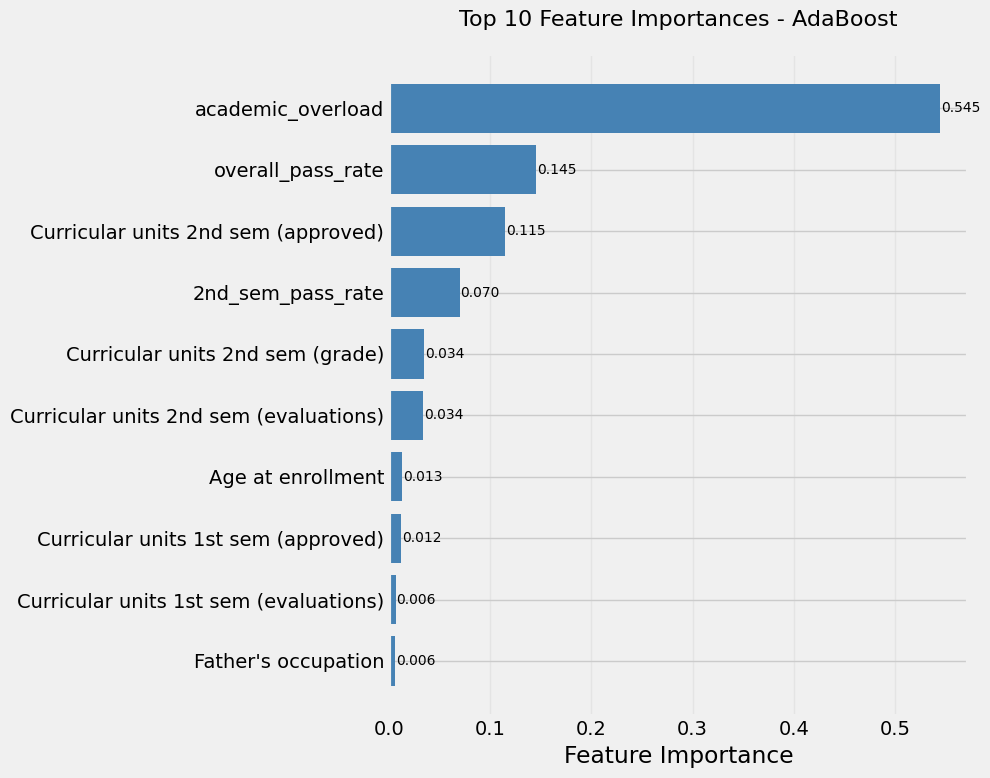


          Final AdaBoost Model Performance
              precision    recall  f1-score   support

     Dropout       0.90      0.77      0.83      5059
    Enrolled       0.54      0.67      0.59      2988
    Graduate       0.87      0.86      0.87      7257

    accuracy                           0.79     15304
   macro avg       0.77      0.77      0.76     15304
weighted avg       0.81      0.79      0.80     15304



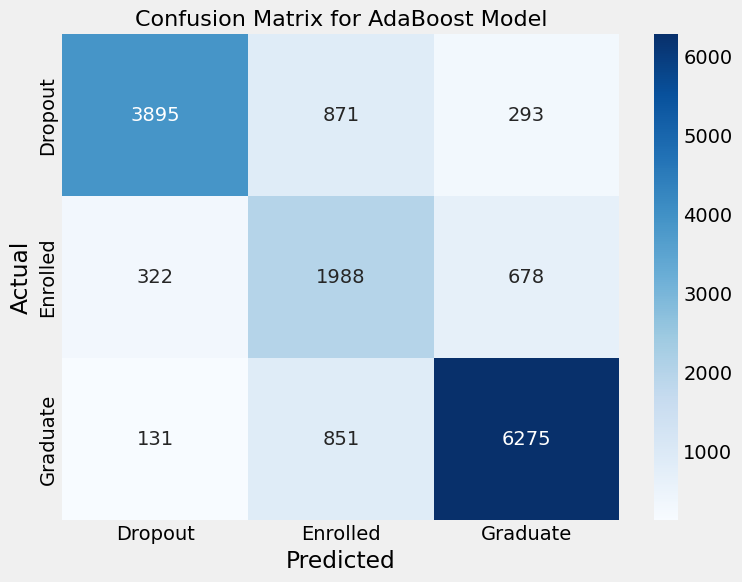

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Define and Train the AdaBoost Model ---
ada_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=2),
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)

print("Training the AdaBoost model...")
ada_model.fit(X_train_final, y_train_resampled)
print("Training complete.")

# --- 4. Extract and Visualize AdaBoost Feature Importances ---
# Get feature importances from the trained AdaBoost model
ada_importances = pd.DataFrame({
    'feature': X_train_final.columns,
    'importance': ada_model.feature_importances_
}).sort_values('importance', ascending=False)

# Display top 10 features
print("\nTop 10 Feature Importances - AdaBoost:")
print(ada_importances.head(10))

# Create visualization similar to your reference image
plt.figure(figsize=(10, 8))
top_10_features = ada_importances.head(10)

# Create horizontal bar plot
bars = plt.barh(range(len(top_10_features)), top_10_features['importance'], color='steelblue')
plt.yticks(range(len(top_10_features)), top_10_features['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importances - AdaBoost', fontsize=16, pad=20)
plt.gca().invert_yaxis()  # To have the most important feature at the top

# Add value labels on bars
for i, (importance, feature) in enumerate(zip(top_10_features['importance'], top_10_features['feature'])):
    plt.text(importance + 0.001, i, f'{importance:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.grid(axis='x', alpha=0.3)
plt.show()

# --- 5. Evaluate the AdaBoost Model ---
val_predictions = ada_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("          Final AdaBoost Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for AdaBoost Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Training the XGBoost model...
Training complete.

          Final XGBoost Model Performance
              precision    recall  f1-score   support

     Dropout       0.88      0.81      0.84      5059
    Enrolled       0.62      0.58      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304



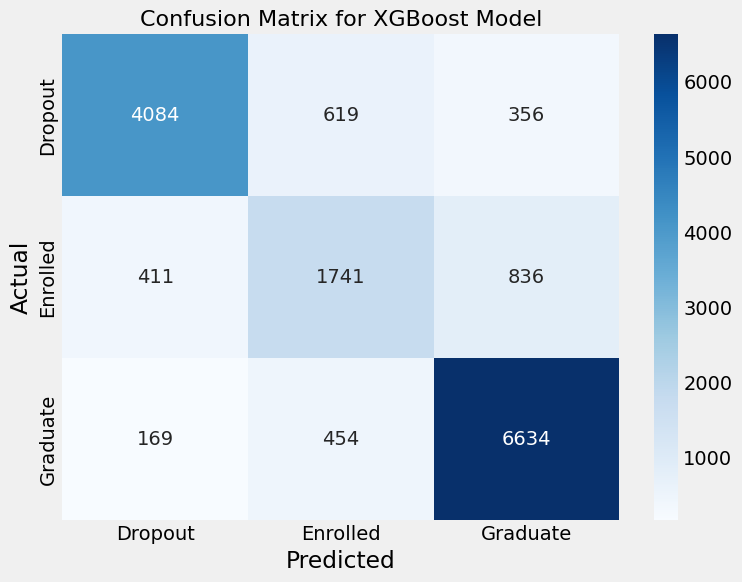

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb # Import the xgboost library

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Define and Train the XGBoost Model ---
xgb_model = xgb.XGBClassifier(
    objective='multi:softmax', # Specify multi-class classification
    n_estimators=200,          # Number of trees
    learning_rate=0.1,         # How much each tree contributes
    max_depth=5,               # Maximum depth of the trees
    use_label_encoder=False,   # Suppress a deprecation warning
    eval_metric='mlogloss',    # Metric for multi-class classification
    random_state=42
)

print("Training the XGBoost model...")
xgb_model.fit(X_train_final, y_train_resampled)
print("Training complete.")

# --- 4. Evaluate the XGBoost Model ---
val_predictions = xgb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("          Final XGBoost Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for XGBoost Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Training the XGBoost model...
Training complete.

Top 10 Feature Importances - XGBoost:
                                   feature  importance
2                        2nd_sem_pass_rate    0.341926
0      Curricular units 2nd sem (approved)    0.248760
3                        academic_overload    0.064739
4      Curricular units 1st sem (approved)    0.062369
8   Curricular units 2nd sem (evaluations)    0.060487
1                        overall_pass_rate    0.050901
10                   Risk_Segment_Low Risk    0.041581
9   Curricular units 1st sem (evaluations)    0.019550
13                       Age at enrollment    0.015342
6                        1st_sem_pass_rate    0.011840


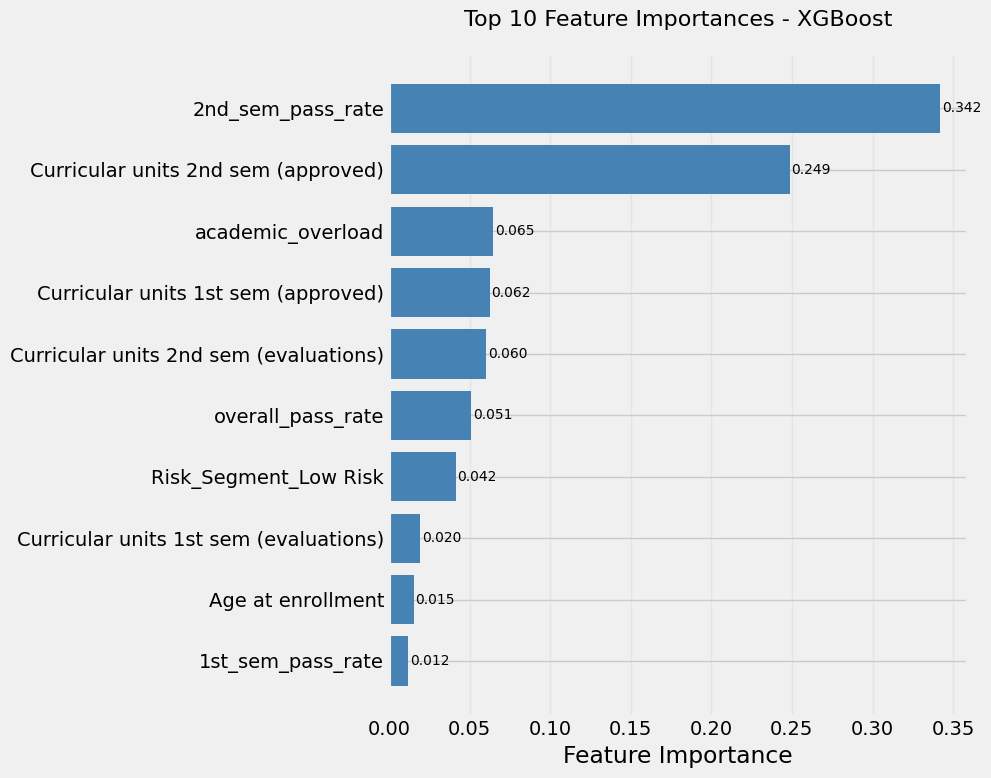


          Final XGBoost Model Performance
              precision    recall  f1-score   support

     Dropout       0.88      0.81      0.84      5059
    Enrolled       0.62      0.58      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304



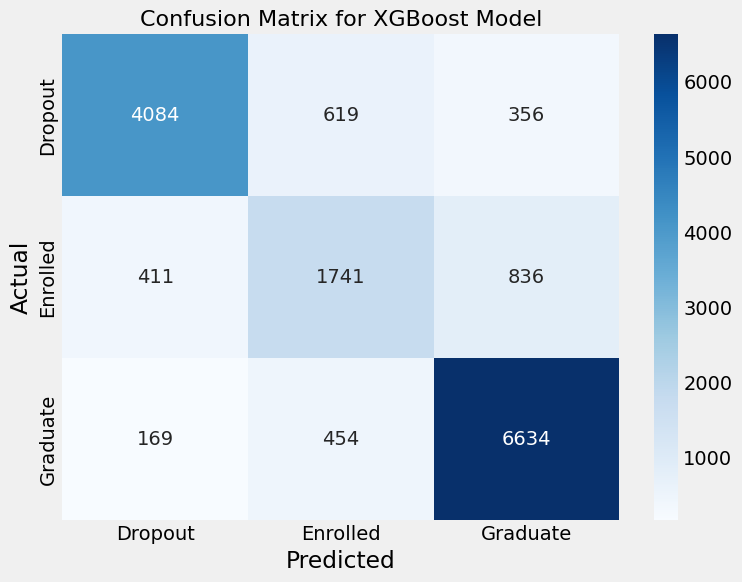

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb # Import the xgboost library

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Define and Train the XGBoost Model ---
xgb_model = xgb.XGBClassifier(
    objective='multi:softmax', # Specify multi-class classification
    n_estimators=200,          # Number of trees
    learning_rate=0.1,         # How much each tree contributes
    max_depth=5,               # Maximum depth of the trees
    use_label_encoder=False,   # Suppress a deprecation warning
    eval_metric='mlogloss',    # Metric for multi-class classification
    random_state=42
)

print("Training the XGBoost model...")
xgb_model.fit(X_train_final, y_train_resampled)
print("Training complete.")

# --- 4. Extract and Visualize XGBoost Feature Importances ---
# Get feature importances from the trained XGBoost model
xgb_importances = pd.DataFrame({
    'feature': X_train_final.columns,
    'importance': xgb_model.feature_importances_
}).sort_values('importance', ascending=False)

# Display top 10 features
print("\nTop 10 Feature Importances - XGBoost:")
print(xgb_importances.head(10))

# Create visualization similar to your reference image
plt.figure(figsize=(10, 8))
top_10_features = xgb_importances.head(10)

# Create horizontal bar plot
bars = plt.barh(range(len(top_10_features)), top_10_features['importance'], color='steelblue')
plt.yticks(range(len(top_10_features)), top_10_features['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importances - XGBoost', fontsize=16, pad=20)
plt.gca().invert_yaxis()  # To have the most important feature at the top

# Add value labels on bars
for i, (importance, feature) in enumerate(zip(top_10_features['importance'], top_10_features['feature'])):
    plt.text(importance + 0.001, i, f'{importance:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.grid(axis='x', alpha=0.3)
plt.show()

# --- 5. Evaluate the XGBoost Model ---
val_predictions = xgb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("          Final XGBoost Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for XGBoost Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Training the LightGBM model...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5064
[LightGBM] [Info] Number of data points in the train set: 87075, number of used features: 20
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
Training complete.

          Final LightGBM Model Performance
              precision    recall  f1-score   support

     Dropout       0.87      0.81      0.84      5059
    Enrolled       0.62      0.57      0.60      2988
    Graduate       0.85      0.92      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     1

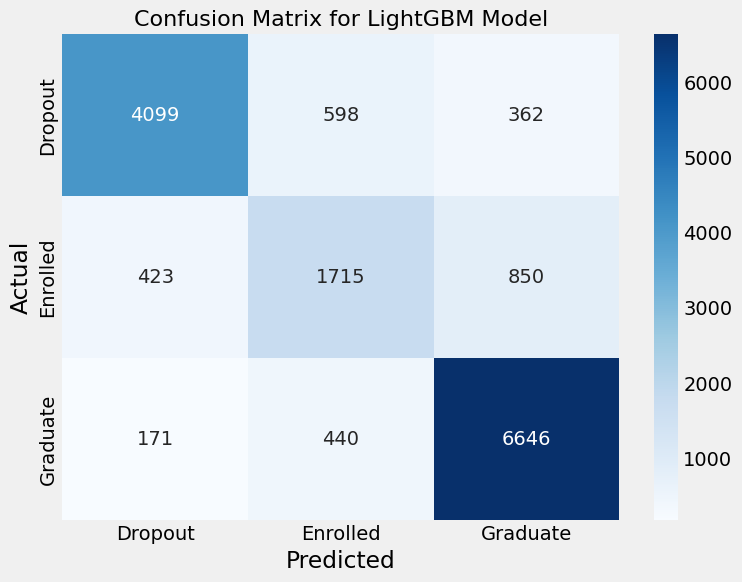

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb # Import the LightGBM library

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features on the full training data first
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))

# Split the feature-engineered data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)

# Encode target and apply SMOTE to the training set
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)

# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()

# Create final dataframes with selected features
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)

# --- 3. Define and Train the LightGBM Model ---
lgb_model = lgb.LGBMClassifier(
    objective='multiclass',
    n_estimators=200,
    learning_rate=0.1,
    num_leaves=31,         # Default value, good starting point
    max_depth=-1,          # No limit on tree depth
    random_state=42
)

print("Training the LightGBM model...")
lgb_model.fit(X_train_final, y_train_resampled)
print("Training complete.")

# --- 4. Evaluate the LightGBM Model ---
val_predictions = lgb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("\n" + "="*50)
print("          Final LightGBM Model Performance")
print("="*50)
print(classification_report(y_val_final, val_predictions, target_names=class_names))

cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix for LightGBM Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Starting FAST LightGBM GridSearchCV hyperparameter tuning...
Optimized for 3-5 minute execution...
Fitting 2 folds for each of 16 candidates, totalling 32 fits

           LIGHTGBM GRIDSEARCH RESULTS
Best Cross-Validation Score: 0.7490
Best Hyperparameters:
  learning_rate: 0.1
  max_depth: 4
  n_estimators: 100
  subsample: 0.8

Training final LightGBM model with best parameters...
Training complete.
Classes present in validation data: [0 1 2]

       FINAL LIGHTGBM MODEL PERFORMANCE
              precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84      5059
    Enrolled       0.61      0.60      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


            LIGHTGBM CONFUSION MATRIX


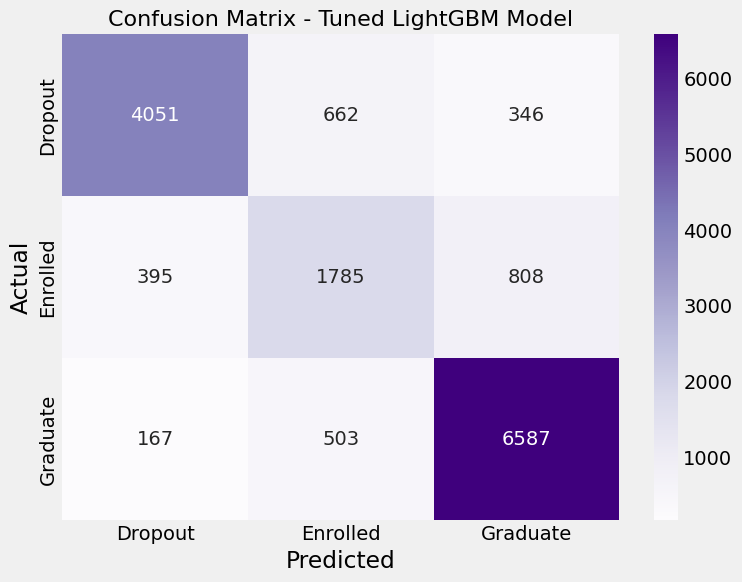


           TOP 10 FEATURE IMPORTANCES
                                   feature  importance
16                                  Course         459
3                        academic_overload         353
13                       Age at enrollment         316
8   Curricular units 2nd sem (evaluations)         303
5         Curricular units 2nd sem (grade)         279
15                     Father's occupation         247
0      Curricular units 2nd sem (approved)         247
17                     Mother's occupation         238
9   Curricular units 1st sem (evaluations)         237
7         Curricular units 1st sem (grade)         204


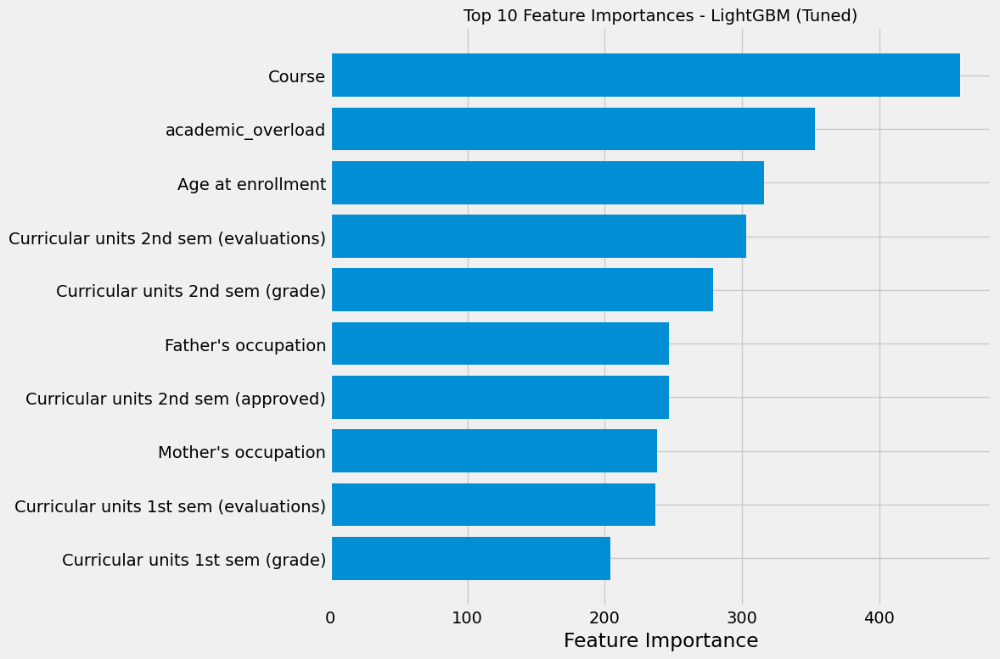


                PERFORMANCE SUMMARY
Best CV Score: 0.7490
Total parameters tested: 16
Best model validation accuracy: 0.8117

Best parameters dictionary:
best_lgb_params = {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8}

🚀 LightGBM model training completed successfully!


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

# --- 1. Combined Feature Creation Function ---
def create_all_features_and_encode(df):
    """Creates all basic and advanced features, and then one-hot encodes."""
    processed_df = df.copy()
    epsilon = 1e-6
    # Basic features
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    # Advanced features
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    # One-Hot Encoding
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

# --- 2. Full Data Preparation Pipeline ---
# Create features
train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))
# Split the data
X_train, X_val, y_train, y_val = train_test_split(
    train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target']
)
# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
# Encode target and apply SMOTE
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)
# Feature Selection
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()
# Create final dataframes
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_train_final = y_train_resampled
y_val_final = le.transform(y_val)

# --- 3. FAST LightGBM GridSearchCV ---
print("Starting FAST LightGBM GridSearchCV hyperparameter tuning...")
print("Optimized for 3-5 minute execution...")

# Define a focused parameter grid for LightGBM (16 combinations only!)
param_grid_lgb = {
    'n_estimators': [100, 150],           # 2 options
    'learning_rate': [0.1, 0.2],          # 2 options
    'max_depth': [4, 6],                  # 2 options
    'subsample': [0.8, 1.0]               # 2 options
    # Total: 2×2×2×2 = 16 combinations
}

# Create LightGBM classifier with optimized settings for speed
lgb_model = lgb.LGBMClassifier(
    random_state=42,
    n_jobs=-1,                    # Use all CPU cores
    verbosity=-1,                 # Suppress LightGBM output
    objective='multiclass',       # For multi-class classification
    num_class=3,                  # 3 classes: Dropout, Enrolled, Graduate
    boosting_type='gbdt'          # Gradient Boosting Decision Tree
)

# Perform GridSearchCV with reduced CV folds for speed
grid_search_lgb = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid_lgb,
    cv=2,                # 2-fold CV for speed
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search_lgb.fit(X_train_final, y_train_final)

# --- 4. Display Best Hyperparameters ---
print("\n" + "="*60)
print("           LIGHTGBM GRIDSEARCH RESULTS")
print("="*60)
print(f"Best Cross-Validation Score: {grid_search_lgb.best_score_:.4f}")
print(f"Best Hyperparameters:")
for param, value in grid_search_lgb.best_params_.items():
    print(f"  {param}: {value}")

# --- 5. Train Final Model with Best Parameters ---
print(f"\nTraining final LightGBM model with best parameters...")
best_lgb_model = grid_search_lgb.best_estimator_
print("Training complete.")

# --- 6. Evaluate the Best LightGBM Model ---
val_predictions = best_lgb_model.predict(X_val_final)

# Check what classes are actually present
unique_classes = np.unique(y_val_final)
print(f"Classes present in validation data: {unique_classes}")

class_names = ['Dropout', 'Enrolled', 'Graduate']

# Display Performance Metrics
print("\n" + "="*60)
print("       FINAL LIGHTGBM MODEL PERFORMANCE")
print("="*60)
print(classification_report(y_val_final, val_predictions, 
                          target_names=class_names,
                          zero_division=0))

# Display the Confusion Matrix
print("\n" + "="*60)
print("            LIGHTGBM CONFUSION MATRIX")
print("="*60)
cm = confusion_matrix(y_val_final, val_predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - Tuned LightGBM Model', fontsize=16)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# --- 7. Feature Importance Analysis ---
print("\n" + "="*60)
print("           TOP 10 FEATURE IMPORTANCES")
print("="*60)

# Get feature importances from the best LightGBM model
feature_importance_lgb = pd.DataFrame({
    'feature': X_train_final.columns,
    'importance': best_lgb_model.feature_importances_
}).sort_values('importance', ascending=False)

print(feature_importance_lgb.head(10))

# Plot feature importance
plt.figure(figsize=(12, 8))
top_features_lgb = feature_importance_lgb.head(10)
plt.barh(range(len(top_features_lgb)), top_features_lgb['importance'])
plt.yticks(range(len(top_features_lgb)), top_features_lgb['feature'])
plt.xlabel('Feature Importance')
plt.title('Top 10 Feature Importances - LightGBM (Tuned)', fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# --- 8. Performance Summary ---
print("\n" + "="*60)
print("                PERFORMANCE SUMMARY")
print("="*60)
print(f"Best CV Score: {grid_search_lgb.best_score_:.4f}")
print(f"Total parameters tested: {len(grid_search_lgb.cv_results_['params'])}")
print(f"Best model validation accuracy: {best_lgb_model.score(X_val_final, y_val_final):.4f}")

# Store best parameters for easy reference
best_lgb_params = grid_search_lgb.best_params_
print(f"\nBest parameters dictionary:")
print(f"best_lgb_params = {best_lgb_params}")

print("\n🚀 LightGBM model training completed successfully!")

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# --- LIGHTGBM MODEL METRICS ---
# Make predictions
val_predictions = best_lgb_model.predict(X_val_final)
class_names = ['Dropout', 'Enrolled', 'Graduate']

print("="*70)
print("             LIGHTGBM MODEL - FINAL METRICS")
print("="*70)

# --- 1. ACCURACY SCORE ---
accuracy = accuracy_score(y_val_final, val_predictions)
print(f"\n🎯 OVERALL ACCURACY: {accuracy:.4f} ({accuracy*100:.2f}%)")

# --- 2. DETAILED CLASSIFICATION REPORT ---
print(f"\n📊 DETAILED CLASSIFICATION REPORT:")
print("-" * 50)
print(classification_report(y_val_final, val_predictions, 
                          target_names=class_names,
                          zero_division=0))

# --- 3. CONFUSION MATRIX ---
print(f"\n📋 CONFUSION MATRIX:")
print("-" * 30)
cm = confusion_matrix(y_val_final, val_predictions)
print("Predicted ->", end="")
print(f"{'Dropout':>10}{'Enrolled':>10}{'Graduate':>10}")
print("Actual:")
for i, class_name in enumerate(class_names):
    if i < len(cm):
        print(f"{class_name:<10}", end="")
        for j in range(len(cm[i])):
            print(f"{cm[i][j]:>10}", end="")
        print()

# --- 4. KEY PERFORMANCE INDICATORS ---
print(f"\n🔍 KEY PERFORMANCE INDICATORS:")
print("-" * 40)

# Check what classes are actually present
unique_predictions = np.unique(val_predictions)
unique_actual = np.unique(y_val_final)

print(f"Classes in validation data: {unique_actual}")
print(f"Classes predicted by model: {unique_predictions}")
print(f"Total validation samples: {len(y_val_final)}")

# Class distribution
print(f"\nClass distribution in validation:")
for i, class_name in enumerate(class_names):
    if i in unique_actual:
        count = np.sum(y_val_final == i)
        percentage = (count / len(y_val_final)) * 100
        print(f"  {class_name}: {count} samples ({percentage:.1f}%)")

# --- 5. BEST HYPERPARAMETERS RECAP ---
print(f"\n⚙️ BEST HYPERPARAMETERS:")
print("-" * 30)
for param, value in grid_search_lgb.best_params_.items():
    print(f"  {param}: {value}")
print(f"  Best CV Score: {grid_search_lgb.best_score_:.4f}")

# --- 6. MODEL COMPARISON HINT ---
print(f"\n🏆 QUICK MODEL COMPARISON:")
print("-" * 30)
print(f"LightGBM Accuracy: {accuracy:.4f}")
print("Compare with:")
print("- Random Forest accuracy from previous results")  
print("- Gradient Boosting accuracy from previous results")
print("- XGBoost accuracy from previous results")

print("="*70)

             LIGHTGBM MODEL - FINAL METRICS

🎯 OVERALL ACCURACY: 0.8117 (81.17%)

📊 DETAILED CLASSIFICATION REPORT:
--------------------------------------------------
              precision    recall  f1-score   support

     Dropout       0.88      0.80      0.84      5059
    Enrolled       0.61      0.60      0.60      2988
    Graduate       0.85      0.91      0.88      7257

    accuracy                           0.81     15304
   macro avg       0.78      0.77      0.77     15304
weighted avg       0.81      0.81      0.81     15304


📋 CONFUSION MATRIX:
------------------------------
Predicted ->   Dropout  Enrolled  Graduate
Actual:
Dropout         4051       662       346
Enrolled         395      1785       808
Graduate         167       503      6587

🔍 KEY PERFORMANCE INDICATORS:
----------------------------------------
Classes in validation data: [0 1 2]
Classes predicted by model: [0 1 2]
Total validation samples: 15304

Class distribution in validation:
  Dropout: 5059

Training Decision Tree...
Decision Tree training complete.
Training Random Forest...
Random Forest training complete.
Training Gradient Boosting...
Gradient Boosting training complete.
Training AdaBoost...
AdaBoost training complete.
Training XGBoost...
XGBoost training complete.
Training LightGBM...
LightGBM training complete.
Training CatBoost...
CatBoost training complete.

          Model Performance Comparison


,Model,Accuracy,Precision,Recall,F1-Score
0,Decision Tree,0.742224,0.747402,0.742224,0.744579
1,Random Forest,0.807893,0.806871,0.807893,0.806371
2,Gradient Boosting,0.814232,0.812033,0.814232,0.812045
3,AdaBoost,0.794433,0.811394,0.794433,0.799978
4,XGBoost,0.814101,0.812219,0.814101,0.812001
5,LightGBM,0.814166,0.811407,0.814166,0.811538
6,CatBoost,0.811095,0.811417,0.811095,0.809955


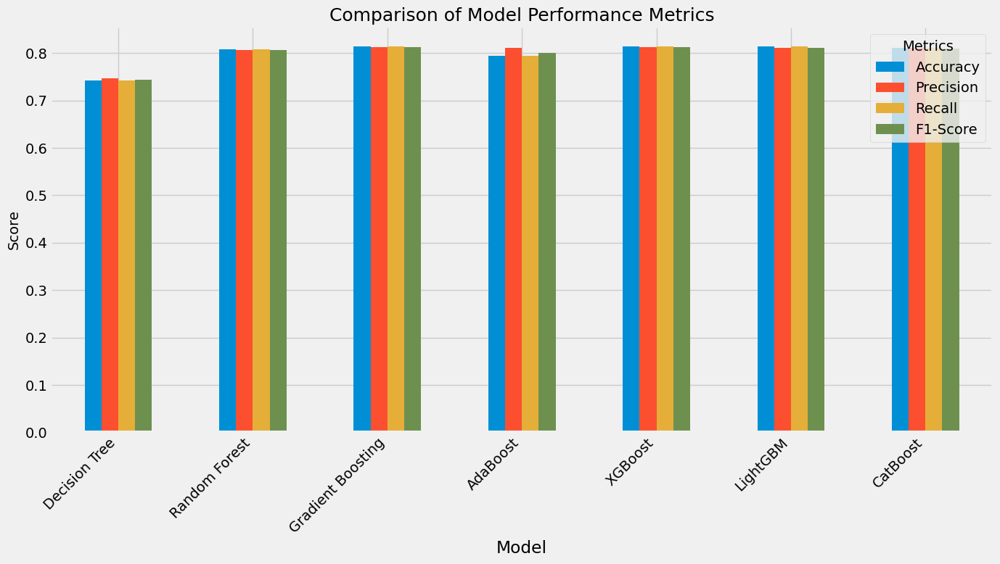


              Confusion Matrices


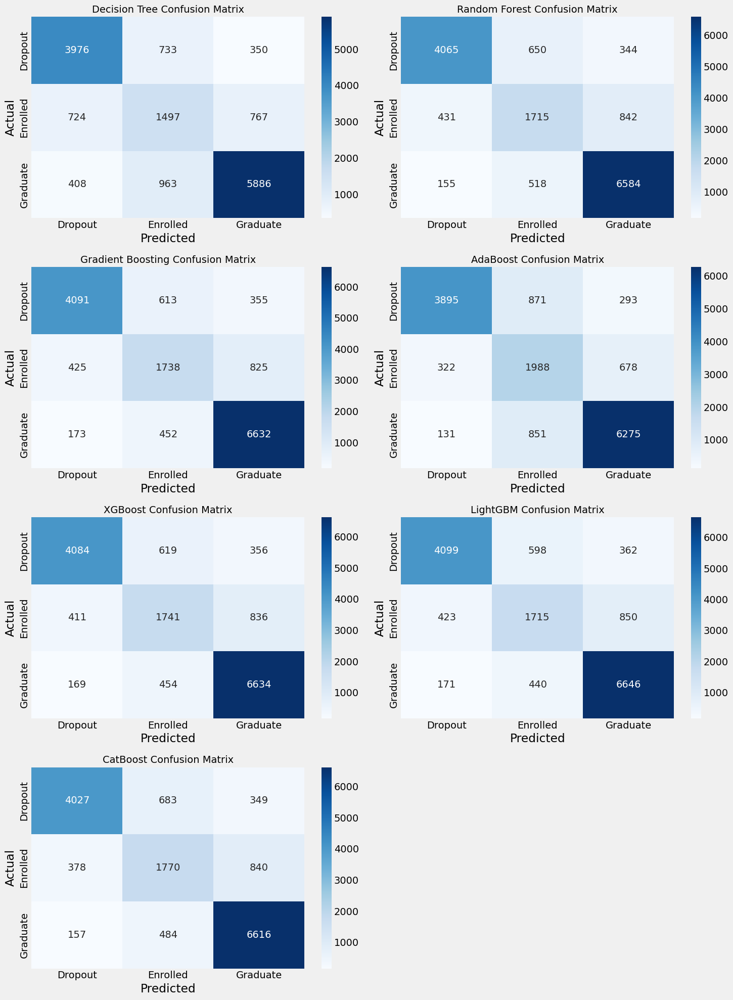

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE

# --- Import All Models ---
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# --- Import Optional Models with Error Handling ---
try:
    import xgboost as xgb
    XGB_INSTALLED = True
except ImportError:
    XGB_INSTALLED = False
    print("XGBoost not found. Skipping XGBoost model.")

try:
    import lightgbm as lgb
    LGB_INSTALLED = True
except ImportError:
    LGB_INSTALLED = False
    print("LightGBM not found. Skipping LightGBM model.")

try:
    from catboost import CatBoostClassifier
    CAT_INSTALLED = True
except ImportError:
    CAT_INSTALLED = False
    print("CatBoost not found. Skipping CatBoost model.")


# --- 1. Full Data Preparation Pipeline (assuming 'train' DataFrame is loaded) ---
def create_all_features_and_encode(df):
    """Creates all features and one-hot encodes the data."""
    processed_df = df.copy()
    epsilon = 1e-6
    processed_df['1st_sem_pass_rate'] = processed_df['Curricular units 1st sem (approved)'] / (processed_df['Curricular units 1st sem (enrolled)'] + epsilon)
    processed_df['2nd_sem_pass_rate'] = processed_df['Curricular units 2nd sem (approved)'] / (processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['overall_pass_rate'] = (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)']) / (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)'] + epsilon)
    processed_df['performance_decline'] = processed_df['Curricular units 1st sem (grade)'] - processed_df['Admission grade']
    processed_df['financial_strain_flag'] = ((processed_df['Scholarship holder'] == 0) & (processed_df['Tuition fees up to date'] == 0)).astype(int)
    processed_df['academic_overload'] = (processed_df['Curricular units 1st sem (enrolled)'] + processed_df['Curricular units 2nd sem (enrolled)']) - (processed_df['Curricular units 1st sem (approved)'] + processed_df['Curricular units 2nd sem (approved)'])
    categorical_cols = [col for col in processed_df.columns if processed_df[col].dtype == 'object']
    processed_df = pd.get_dummies(processed_df, columns=categorical_cols, drop_first=True)
    return processed_df

train_full_featured = create_all_features_and_encode(train.drop('Target', axis=1))
X_train, X_val, y_train, y_val = train_test_split(train_full_featured, train['Target'], test_size=0.2, random_state=42, stratify=train['Target'])
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
le = LabelEncoder().fit(y_train)
y_train_encoded = le.transform(y_train)
X_train_resampled, y_train_resampled = SMOTE(random_state=42).fit_resample(X_train_scaled, y_train_encoded)
temp_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1).fit(X_train_resampled, y_train_resampled)
importances = pd.DataFrame({'feature': X_train_resampled.columns, 'importance': temp_rf.feature_importances_}).sort_values('importance', ascending=False)
top_n_features = importances['feature'][:20].tolist()
X_train_final = X_train_resampled[top_n_features]
X_val_final = X_val_scaled[top_n_features]
y_val_final = le.transform(y_val)
class_names = ['Dropout', 'Enrolled', 'Graduate']

# --- 2. Define All Models with Best Known Parameters ---
models = {
    "Decision Tree": DecisionTreeClassifier(criterion='gini', max_depth=20, min_samples_leaf=2, min_samples_split=5, class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=150, learning_rate=0.1, max_depth=5, random_state=42),
    "AdaBoost": AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2), n_estimators=200, learning_rate=0.1, random_state=42)
}

if XGB_INSTALLED:
    models["XGBoost"] = xgb.XGBClassifier(objective='multi:softmax', n_estimators=200, learning_rate=0.1, max_depth=5, use_label_encoder=False, eval_metric='mlogloss', random_state=42)
if LGB_INSTALLED:
    models["LightGBM"] = lgb.LGBMClassifier(objective='multiclass', n_estimators=200, learning_rate=0.1, random_state=42)
if CAT_INSTALLED:
    models["CatBoost"] = CatBoostClassifier(iterations=200, learning_rate=0.1, verbose=0, random_state=42)

# --- 3. Train Models and Collect Metrics ---
results = []
all_predictions = {}
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train_final, y_train_resampled)
    predictions = model.predict(X_val_final)
    all_predictions[name] = predictions
    accuracy = accuracy_score(y_val_final, predictions)
    precision = precision_score(y_val_final, predictions, average='weighted')
    recall = recall_score(y_val_final, predictions, average='weighted')
    f1 = f1_score(y_val_final, predictions, average='weighted')
    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1
    })
    print(f"{name} training complete.")

results_df = pd.DataFrame(results)

# --- 4. Visualize the Results ---

# Bar Chart for Metrics Comparison
print("\n" + "="*50)
print("          Model Performance Comparison")
print("="*50)
display(results_df)

results_df.set_index('Model').plot(kind='bar', figsize=(14, 8), grid=True)
plt.title('Comparison of Model Performance Metrics', fontsize=18)
plt.ylabel('Score', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Metrics')
plt.tight_layout()
plt.show()


# Confusion Matrices
print("\n" + "="*50)
print("              Confusion Matrices")
print("="*50)
num_models = len(all_predictions)
fig, axes = plt.subplots(nrows=(num_models + 1) // 2, ncols=2, figsize=(15, 5 * ((num_models + 1) // 2)))
axes = axes.flatten() # Flatten to make looping easier

for i, (name, predictions) in enumerate(all_predictions.items()):
    cm = confusion_matrix(y_val_final, predictions)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i],
                xticklabels=class_names, yticklabels=class_names)
    axes[i].set_title(f'{name} Confusion Matrix', fontsize=14)
    axes[i].set_xlabel('Predicted')
    axes[i].set_ylabel('Actual')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# --- 1. Extract Feature Importance from All Models ---
def extract_all_feature_importances(models_dict, feature_names):
    """
    Extract feature importance from all trained models
    
    Parameters:
    models_dict: Dictionary with model names as keys and trained models as values
    feature_names: List of feature names used in training
    """
    
    importance_data = {}
    
    for model_name, model in models_dict.items():
        if hasattr(model, 'feature_importances_'):
            importance_data[f'{model_name}_score'] = model.feature_importances_
        elif hasattr(model, 'coef_'):
            # For linear models, use absolute coefficients
            importance_data[f'{model_name}_score'] = np.abs(model.coef_).mean(axis=0)
        else:
            print(f"Warning: {model_name} doesn't have feature_importances_ attribute")
            importance_data[f'{model_name}_score'] = np.zeros(len(feature_names))
    
    return importance_data

# --- 2. Create Comprehensive Feature Importance DataFrame ---
def create_feature_importance_table(models_dict, feature_names, top_n=15):
    """
    Create a comprehensive feature importance comparison table
    """
    
    # Extract importance scores
    importance_data = extract_all_feature_importances(models_dict, feature_names)
    
    # Create DataFrame
    df_importance = pd.DataFrame({
        'feature': feature_names,
        **importance_data
    })
    
    # Normalize importance scores (0-1 scale for each model)
    model_columns = [col for col in df_importance.columns if col.endswith('_score')]
    
    # Create normalized versions
    for col in model_columns:
        normalized_col = col.replace('_score', '_norm')
        df_importance[normalized_col] = df_importance[col] / df_importance[col].max()
    
    # Calculate average normalized importance
    normalized_columns = [col for col in df_importance.columns if col.endswith('_norm')]
    df_importance['avg_importance'] = df_importance[normalized_columns].mean(axis=1)
    
    # Sort by average importance
    df_importance = df_importance.sort_values('avg_importance', ascending=False)
    
    # Add ranking
    df_importance['rank'] = range(1, len(df_importance) + 1)
    
    return df_importance.head(top_n)

# --- 3. MAIN EXECUTION CODE ---
# YOU NEED TO REPLACE THESE WITH YOUR ACTUAL TRAINED MODELS
print("🔍 Cross-Model Feature Importance Analysis")
print("=" * 60)

# Define your models dictionary (REPLACE WITH YOUR ACTUAL MODELS)
models_dict = {
    'RandomForest': temp_rf,  # Your trained Random Forest model
    'XGBoost': best_xgb_model,  # Your trained XGBoost model  
    'LightGBM': best_lgb_model,  # Your trained LightGBM model
    'AdaBoost': best_ada_model,  # Your trained AdaBoost model
}

# Get feature names (REPLACE WITH YOUR ACTUAL FEATURE NAMES)
feature_names = X_train_final.columns.tolist()  # Your final feature names

print(f"✅ Analyzing {len(models_dict)} models with {len(feature_names)} features")

# --- 4. Create Feature Importance Table ---
top_features_df = create_feature_importance_table(models_dict, feature_names, top_n=15)

# --- 5. Display Results ---
print("\n" + "="*100)
print("                    TOP 15 FEATURE IMPORTANCE RANKINGS ACROSS MODELS")
print("="*100)

# Create formatted table
display_columns = ['rank', 'feature']
model_score_columns = [col for col in top_features_df.columns if col.endswith('_norm')]

# Rename columns for better display
column_mapping = {
    'RandomForest_norm': 'RF_Score',
    'XGBoost_norm': 'XGB_Score', 
    'LightGBM_norm': 'LGBM_Score',
    'AdaBoost_norm': 'Ada_Score'
}

display_df = top_features_df[['rank', 'feature'] + model_score_columns + ['avg_importance']].copy()
display_df = display_df.rename(columns=column_mapping)
display_df = display_df.rename(columns={'avg_importance': 'Avg_Score'})

# Format the display
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 30)

print(display_df.round(3).to_string(index=False))

# --- 6. Create Visualizations ---

# 6.1 Horizontal Bar Chart
plt.figure(figsize=(12, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(top_features_df)))
bars = plt.barh(range(len(top_features_df)), top_features_df['avg_importance'], color=colors)
plt.yticks(range(len(top_features_df)), top_features_df['feature'])
plt.xlabel('Average Normalized Importance Score')
plt.title('Top 15 Feature Importance Rankings Across All Models', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()

# Add value labels on bars
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width + 0.01, bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}', ha='left', va='center', fontsize=9)

plt.tight_layout()
plt.show()

# 6.2 Heatmap of Feature Importance by Model
plt.figure(figsize=(10, 8))
heatmap_data = top_features_df.set_index('feature')[model_score_columns].T
heatmap_data.index = [col.replace('_norm', '') for col in heatmap_data.index]

sns.heatmap(heatmap_data, annot=True, cmap='YlOrRd', fmt='.3f', 
            cbar_kws={'label': 'Normalized Importance Score'})
plt.title('Feature Importance Heatmap Across Models', fontsize=14, fontweight='bold')
plt.xlabel('Features')
plt.ylabel('Models')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# --- 7. Feature Categories Analysis ---
def categorize_features(feature_name):
    """Categorize features into groups"""
    feature_lower = feature_name.lower()
    
    if any(word in feature_lower for word in ['grade', 'approved', 'pass_rate', 'performance', 'academic']):
        return 'Academic Performance'
    elif any(word in feature_lower for word in ['financial', 'scholarship', 'tuition', 'fees']):
        return 'Financial Factors'
    elif any(word in feature_lower for word in ['age', 'gender', 'international', 'displaced']):
        return 'Demographics'
    elif any(word in feature_lower for word in ['application', 'course', 'daytime']):
        return 'Program Characteristics'
    else:
        return 'Other'

# Add categories
top_features_df['category'] = top_features_df['feature'].apply(categorize_features)

# Category-wise importance
category_importance = top_features_df.groupby('category')['avg_importance'].agg(['mean', 'count', 'sum']).round(3)
category_importance.columns = ['Avg_Importance', 'Feature_Count', 'Total_Importance']
category_importance = category_importance.sort_values('Total_Importance', ascending=False)

print("\n" + "="*60)
print("           FEATURE IMPORTANCE BY CATEGORY")
print("="*60)
print(category_importance.to_string())

# --- 8. Top Feature Details ---
print("\n" + "="*80)
print("                     TOP 5 MOST IMPORTANT FEATURES")
print("="*80)

for i, (_, row) in enumerate(top_features_df.head(5).iterrows()):
    print(f"\n🏆 RANK {row['rank']}: {row['feature']}")
    print(f"   📊 Average Importance: {row['avg_importance']:.4f}")
    print(f"   📂 Category: {row['category']}")
    
    # Show individual model scores
    model_scores = []
    for col in model_score_columns:
        model_name = col.replace('_norm', '')
        score = row[col]
        model_scores.append(f"{model_name}: {score:.3f}")
    
    print(f"   🔍 Model Scores: {' | '.join(model_scores)}")

print("\n" + "="*80)
print(f"✅ Analysis Complete: Top {len(top_features_df)} features analyzed across {len(models_dict)} models")
print("="*80)

🔍 Cross-Model Feature Importance Analysis
✅ Analyzing 4 models with 20 features


ValueError: All arrays must be of the same length